<a href="https://colab.research.google.com/github/tyhardison/Research-Project-Locational-Impact-on-Health-Habits-Amongst-Demographics/blob/main/main_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Locational Impact on Health Habits Amongst Demographics**
### **Created By: Ty Hardison on 4/27/2026**
### **Affiliation: Texas A&M University**
### **Course: CSCE 676**

---

**Welcome to my research analysis. This project was developed in Google Colab running Python 3.12.13**

**(Version update as of March 4, 2026)**

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 1 — SETUP
# ═════════════════════════════════════════════════════════════════════════════

!pip install adjustText -q

import warnings
warnings.filterwarnings("ignore")

import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.patches as mpatches
import matplotlib.patheffects as pe
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.graph_objects as go
from adjustText import adjust_text
from google.colab import drive

# Reproducibility
random.seed(42)
np.random.seed(42)

# Global plot style
sns.set_theme(style='whitegrid', palette='Set2')
plt.rcParams['figure.dpi']     = 120
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['axes.labelsize'] = 11

# tab10 chosen for 10 distinct colors — needed for Race/Ethnicity (8 values)
PALETTE = 'tab10'

drive.mount('/content/drive')
print("Setup complete.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Setup complete.


## **Preliminary Setup**



---

This cell contains all of the necessary installs, imports and libraries that are used throughout this file. Various reproducible seed and style parameters are provided.

**Notable parameters:**

Random Seed - 42: this ensures reproducible results when running the notebook multiple times and keeps the processes between Python and numpy consistent

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 2 — HELPER FUNCTIONS
# All shared utilities defined once here and reused throughout the project
# ═════════════════════════════════════════════════════════════════════════════

def w_mean(df, value_col, weight_col='Sample Size'):
    """Sample-size-weighted mean."""
    return np.average(df[value_col], weights=df[weight_col])


def w_agg(df, group_by, value_col='Percentage', weight_col='Sample Size'):
    """
    Group df and return weighted mean for each group.
    Manual loop used instead of groupby/apply to avoid pandas version issues.
    """
    records = []
    for keys, grp in df.groupby(group_by):
        if not isinstance(keys, tuple):
            keys = (keys,)
        records.append(
            dict(zip(group_by, keys)) |
            {'Weighted %': np.average(grp[value_col], weights=grp[weight_col])}
        )
    return pd.DataFrame(records)


def harmonic(n1, n2):
    """
    Harmonic mean of two sample sizes.
    Conservative reliability weight — penalizes imbalanced sample pairings.
    Always <= arithmetic mean, so never overstates reliability.
    """
    return (2 * n1 * n2) / (n1 + n2)


def w_pearson(x, y, w):
    """
    Weighted Pearson correlation.
    Built from scratch — scipy pearson r does not support weights.
    Inputs forced to 1D float arrays to prevent pandas shape issues.
    """
    x, y, w = (np.asarray(v, dtype=float).flatten() for v in (x, y, w))
    w = w / w.sum()
    xm, ym = (w * x).sum(), (w * y).sum()
    cov    = (w * (x - xm) * (y - ym)).sum()
    sx     = np.sqrt((w * (x - xm) ** 2).sum())
    sy     = np.sqrt((w * (y - ym) ** 2).sum())
    return np.nan if (sx == 0 or sy == 0) else cov / (sx * sy)


def scale_pt_sizes(series, lo=30, hi=350):
    """Map a series to point sizes for scatter plots via min-max scaling."""
    s = series.copy().astype(float)
    return lo + (hi - lo) * (s - s.min()) / (s.max() - s.min() + 1e-9)


def plot_wls_line(ax, x, y, w, color):
    """Fit and draw a weighted least-squares regression line."""
    if len(x) < 5:
        return
    coeffs = np.polyfit(x, y, deg=1, w=w)
    xl     = np.linspace(x.min(), x.max(), 50)
    ax.plot(xl, np.polyval(coeffs, xl),
            color=color, lw=1.5, ls='--', alpha=0.8)


def extreme_points(df, xcol, ycol, z=1.0):
    """Return rows simultaneously above z std devs on both axes."""
    xz = (df[xcol] - df[xcol].mean()) / (df[xcol].std() + 1e-9)
    yz = (df[ycol] - df[ycol].mean()) / (df[ycol].std() + 1e-9)
    return df[(xz > z) & (yz > z)]


def label_extremes(ax, df, xcol, ycol, z=1.0):
    """Annotate extreme points with state name, auto-adjusting for overlap."""
    pts   = extreme_points(df, xcol, ycol, z)
    texts = [
        ax.text(r[xcol], r[ycol], r['State'], fontsize=6, alpha=0.8,
                path_effects=[pe.withStroke(linewidth=1.5, foreground='white')])
        for _, r in pts.iterrows()
    ]
    if texts:
        try:
            adjust_text(texts, ax=ax,
                        arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
        except Exception:
            pass


def color_col(df, group_col):
    """
    Return df with '_color_val' column for a demographic lens.
    Region is a direct column; all others are in the Group/Group Value pair.
    """
    if group_col == 'Region':
        out = df.copy()
        out['_color_val'] = out['Region']
    else:
        out = df[df['Group'] == group_col].copy()
        out['_color_val'] = out['Group Value']
    return out.dropna(subset=['_color_val'])


def trend_chart(df, group_col, val_col='Weighted %', title=''):
    """Line chart — one line per group value over time."""
    fig, ax = plt.subplots(figsize=(12, 6))
    groups  = df[group_col].unique()
    pal     = sns.color_palette(PALETTE, len(groups))
    for color, grp in zip(pal, groups):
        sub = df[df[group_col] == grp].sort_values('Year')
        ax.plot(sub['Year'], sub[val_col], marker='o', label=grp, color=color)
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set(title=title, xlabel='Year', ylabel='Weighted %')
    ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=9)
    plt.tight_layout()
    plt.show()


print("Helpers loaded.")

Helpers loaded.


## **Helper Function Setup**



---

This cell declares every reusable statistical and visualization function used throughout the code. This is to keep the report clean and orderly as well as avoid unnecessisary redundancy. Additionally, it ensures consistent calculation. You can use this cell as a quick reference for any calculations that occur downstream. Additionally, a brief description of each function can be found under the declaration of each code (the use and purpose of major components will be discussed in further detail as they show up within the analysis).

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 3 — DATA LOADING & CLEANING
# Produces three analytical tables: HealthStatus, HealthHabits, HealthDiet
# ═════════════════════════════════════════════════════════════════════════════

# ── Load ──────────────────────────────────────────────────────────────────────
raw = pd.read_csv('/content/drive/MyDrive/CSCE_676/Project/Obesity.csv')

# ── Clean ─────────────────────────────────────────────────────────────────────
df = (raw
      .loc[raw['Data_Value_Footnote_Symbol'].isna()]   # remove suppressed rows
      .loc[raw['Total'] != 'Total']                    # remove population aggregates
      .loc[raw['Income'] != 'Data not reported']       # remove non-disclosed income
      .copy()
)

# Standardize one education spelling variant
df['Education'] = df['Education'].replace(
    'some college or technical sch', 'Some college or technical sch'
)

# ── State → Urbanicity mapping ────────────────────────────────────────────────
# Based on NCHS Urban-Rural Classification Scheme (designed for health data).
# Four levels: Urban, Suburban, Rural, Mixed (states with no clear majority).
# Any state not in the map defaults to Mixed — the most honest fallback.
URBANICITY = {
    # Urban
    'California':'Urban','New York':'Urban','Illinois':'Urban',
    'Massachusetts':'Urban','New Jersey':'Urban','Maryland':'Urban',
    'Connecticut':'Urban','Washington':'Urban','Colorado':'Urban',
    'Oregon':'Urban','Nevada':'Urban','Rhode Island':'Urban',
    'District of Columbia':'Urban','Delaware':'Urban',
    # Suburban
    'Pennsylvania':'Suburban','Ohio':'Suburban','Michigan':'Suburban',
    'Virginia':'Suburban','Arizona':'Suburban','Indiana':'Suburban',
    'Missouri':'Suburban','Wisconsin':'Suburban','Tennessee':'Suburban',
    'Utah':'Suburban','Kansas':'Suburban','Nebraska':'Suburban',
    'New Hampshire':'Suburban','New Mexico':'Suburban',
    'Idaho':'Suburban','Maine':'Suburban',
    # Rural
    'Wyoming':'Rural','Montana':'Rural','North Dakota':'Rural',
    'South Dakota':'Rural','Alaska':'Rural','Vermont':'Rural',
    'West Virginia':'Rural','Mississippi':'Rural',
    'Arkansas':'Rural','Iowa':'Rural',
    # Mixed — genuinely heterogeneous states
    'Texas':'Mixed','Florida':'Mixed','Georgia':'Mixed',
    'North Carolina':'Mixed','South Carolina':'Mixed','Alabama':'Mixed',
    'Louisiana':'Mixed','Kentucky':'Mixed','Oklahoma':'Mixed',
    'Minnesota':'Mixed','Hawaii':'Mixed',
    # National and territories
    'National':'National','Puerto Rico':'Territory',
    'Guam':'Territory','Virgin Islands':'Territory',
}
df['Region'] = df['LocationDesc'].map(URBANICITY).fillna('Mixed')

# ── Select columns needed downstream ──────────────────────────────────────────
GRP_COLS  = ['Age(years)', 'Education', 'Sex', 'Income', 'Race/Ethnicity']
KEEP_COLS = ['YearStart','LocationDesc','Region','Class',
             'Question','Data_Value','Sample_Size'] + GRP_COLS
df = df[KEEP_COLS].copy()

# Confirm exactly one group column is populated per row
n_bad = (df[GRP_COLS].notna().sum(axis=1) != 1).sum()
print("Group column check:", "PASS" if n_bad == 0 else f"WARNING — {n_bad} bad rows")

# ── Unpivot: 5 group columns → (Group, Group Value) ──────────────────────────
# stack() drops nulls by default → exactly one output row per input row
df_long = (
    df.set_index(['YearStart','LocationDesc','Region','Class',
                  'Question','Data_Value','Sample_Size'])
      [GRP_COLS]
      .stack()
      .reset_index()
      .rename(columns={'level_7':'Group', 0:'Group Value',
                        'YearStart':'Year','LocationDesc':'State',
                        'Data_Value':'Percentage','Sample_Size':'Sample Size'})
)

BASE = ['Year','State','Region','Class','Group','Group Value',
        'Percentage','Sample Size']

# ── HealthStatus ──────────────────────────────────────────────────────────────
# Each respondent is classified as Obese OR Overweight (mutually exclusive).
# Both are kept separately here and combined with a sum in Cell 7.
WS_MAP = {
    'Percent of adults aged 18 years and older who have obesity'                      : 'Obese',
    'Percent of adults aged 18 years and older who have an overweight classification' : 'Overweight',
}
hs = df_long[df_long['Class'] == 'Obesity / Weight Status'].copy()
hs['Weight Status'] = hs['Question'].map(WS_MAP)
HealthStatus = hs.dropna(subset=['Weight Status'])[BASE + ['Weight Status']].reset_index(drop=True)

# ── HealthHabits ──────────────────────────────────────────────────────────────
# Five activity questions represent different behavioral thresholds.
# Each maps to (Moderate AE min, Vigorous AE min, Strength Training, No Activity).
ACT_MAP = {
    'Percent of adults who achieve at least 150 minutes a week of moderate-intensity aerobic physical activity or 75 minutes a week of vigorous-intensity aerobic activity (or an equivalent combination)'                                                                                                                    : (150, 75,  False, False),
    'Percent of adults who achieve at least 150 minutes a week of moderate-intensity aerobic physical activity or 75 minutes a week of vigorous-intensity aerobic physical activity (or an equivalent combination) and engage in muscle-strengthening activities on 2 or more days a week'                               : (150, 75,  True,  False),
    'Percent of adults who achieve more than 300 minutes a week of moderate-intensity aerobic physical activity or 150 minutes a week of vigorous-intensity aerobic activity (or an equivalent combination)'                                                                                                                : (300, 150, False, False),
    'Percent of adults who engage in muscle-strengthening activities on 2 or more days a week'                                                                                                                                                                                                                            : (0,   0,   True,  False),
    'Percent of adults who engage in no leisure-time physical activity'                                                                                                                                                                                                                                                   : (0,   0,   False, True),
}

def activity_label(row):
    """Convert activity metric tuple to a readable profile name."""
    if row['No Activity']:               return 'No Activity'
    if row['Strength Training'] and row['Moderate AE (Min)'] == 150: return '150 Min + Strength'
    if row['Strength Training']:         return 'Strength Only'
    if row['Moderate AE (Min)'] == 300:  return '300+ Min Aerobic'
    if row['Moderate AE (Min)'] == 150:  return '150 Min Aerobic'
    return 'Other'

ha = df_long[df_long['Class'] == 'Physical Activity'].copy()
ha[['Moderate AE (Min)','Vigorous AE (Min)','Strength Training','No Activity']] = (
    ha['Question'].map(ACT_MAP).apply(pd.Series)
)
ha['Activity Profile'] = ha.apply(activity_label, axis=1)
HealthHabits = (ha.dropna(subset=['Moderate AE (Min)'])
                  [BASE + ['Moderate AE (Min)','Vigorous AE (Min)',
                            'Strength Training','No Activity','Activity Profile']]
                  .reset_index(drop=True))

# ── HealthDiet ────────────────────────────────────────────────────────────────
DIET_MAP = {
    'Percent of adults who report consuming fruit less than one time daily'      : 'No Fruit',
    'Percent of adults who report consuming vegetables less than one time daily' : 'No Vegetables',
}
hd = df_long[df_long['Class'] == 'Fruits and Vegetables'].copy()
hd['No Fruits and Vegetables'] = hd['Question'].map(DIET_MAP)
HealthDiet = (hd.dropna(subset=['No Fruits and Vegetables'])
                [BASE + ['No Fruits and Vegetables']]
                .reset_index(drop=True))

print(f"HealthStatus : {HealthStatus.shape[0]:,} rows")
print(f"HealthHabits : {HealthHabits.shape[0]:,} rows")
print(f"HealthDiet   : {HealthDiet.shape[0]:,} rows")

Group column check: PASS
HealthStatus : 35,152 rows
HealthHabits : 47,311 rows
HealthDiet   : 7,511 rows


## **Data Cleaning and Processing**



---

**Preface**

To first get aquainted with the dataset. This data is directly from a CDC survey collecting within the United States and terroritory statistics regarding obesity/overweight status and health habits. Each respondent was asked the same questions with standardized response options (no free responses). Additionally, for each survey they were asked a series of demographic quesitons such as sex, age range, education level, ethnicity and income level. The raw data is presented such that each row represents 1 of these demographic groups for each combination of state, year and 'health question' (obese, activity level or diet), spanning from 2011 to 2024. Laslty, each row is representative of that population and not one individual, thus data is presented as a sample size and percentage of respondents who match those values.

**Processing Steps**

After the initial loading, to clean the data I remove any row that does not contain information (indicated by the existence of footnote values) as well as rows indicating a 'total' as to not double up on information. Additionally I eliminate rows where respondents opted for the option not to report income level.

From this point, the data needed to be presented in a way where meaningful comparisons could be made. To begin, I aimed to narrow down geolocation data into categories. Since actual coordinates were unified by state and no specific points exist, I opted to use the National Center of Health Statistics Urban-Rural classification scheme designed for CDC use. This will help in later interpretations of trends. (Note: there is also consideration for mixed and suburban states). Since surveys were conducted by random selection via telephone across all of the state, I believe this to be an accurate representation for the sake of this analysis.

Moving forward, the most essential alteration of the dataset is made. To make the dataset easier to work with, rather than having multiple empty columns and one valued column for each demographic 3 new tables are created (one for health status, one for health activity and one for diet) and each row in each table contains 2 columns (group and group value) that contain what demographic category is being assessed for a given set of state, year and health attributes and a value indicating the group for that demographic - carrying over the same sample size and perentage from the previous original table. This seperation allows us to isolate health metrics in analysis as well and create a uniform format to run functions against when analyzing specific demographic groups, rather than working with multiple columns with search functions and empty values.

Lastly, much of the standardized text in the survey has been mapped to altnernative but meaningfully equivalent labels in order to shorten much of the text.

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 4 — DATA QUALITY CHECKS
# Coverage audit across all three tables before any analysis
# ═════════════════════════════════════════════════════════════════════════════

for name, tbl in [('HealthStatus', HealthStatus),
                   ('HealthHabits', HealthHabits),
                   ('HealthDiet',   HealthDiet)]:
    print(f"\n{'─'*50}")
    print(f" {name}")
    print(f"{'─'*50}")
    print(f"  Years         : {sorted(tbl['Year'].unique())}")
    print(f"  States        : {tbl['State'].nunique()} unique")
    print(f"  Groups        : {tbl['Group'].unique().tolist()}")
    print(f"  Regions       : {tbl['Region'].unique().tolist()}")
    print(f"  Sample Size   :\n{tbl['Sample Size'].describe().round(0).to_string()}")
    print(f"  n < 50        : {(tbl['Sample Size'] < 50).sum()} rows")
    print(f"  Weighted mean : {w_mean(tbl, 'Percentage'):.1f}%")


──────────────────────────────────────────────────
 HealthStatus
──────────────────────────────────────────────────
  Years         : [np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024)]
  States        : 55 unique
  Groups        : ['Income', 'Age(years)', 'Race/Ethnicity', 'Education', 'Sex']
  Regions       : ['Mixed', 'Rural', 'Suburban', 'Urban', 'National', 'Territory']
  Sample Size   :
count     35152.0
mean       3130.0
std       15257.0
min          50.0
25%         455.0
50%         995.0
75%        2152.0
max      371669.0
  n < 50        : 0 rows
  Weighted mean : 33.0%

──────────────────────────────────────────────────
 HealthHabits
──────────────────────────────────────────────────
  Years         : [np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.in

HEALTHSTATUS EDA


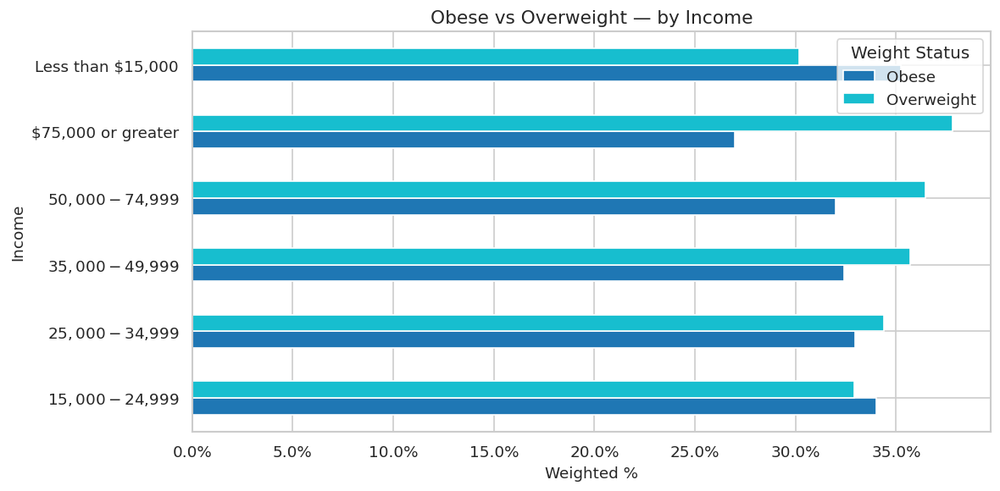

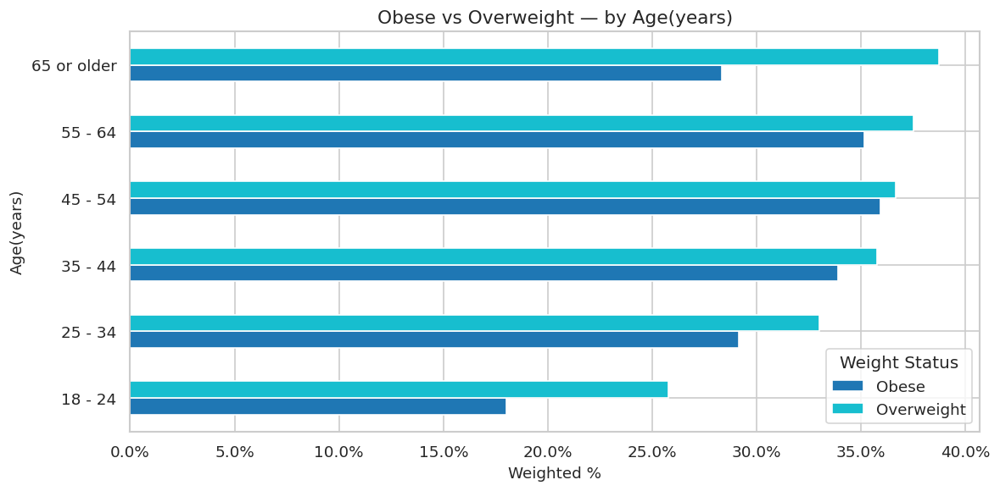

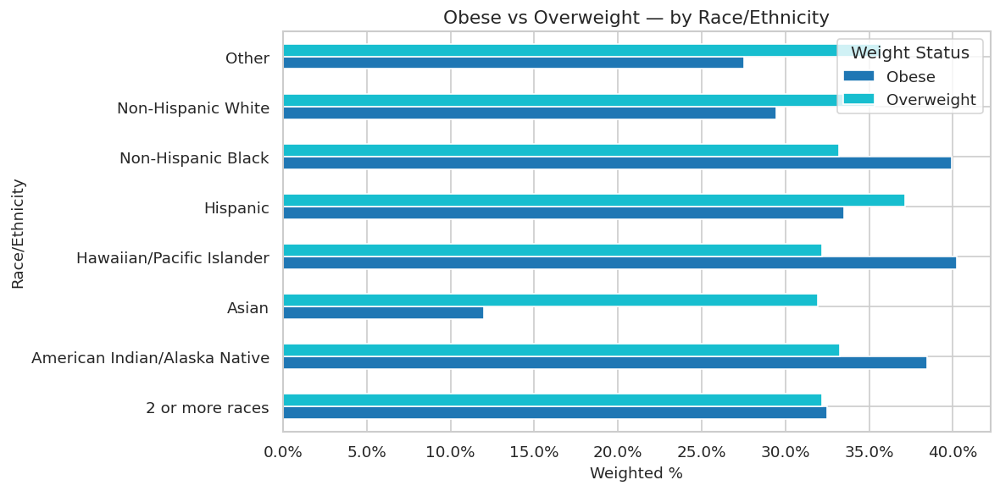

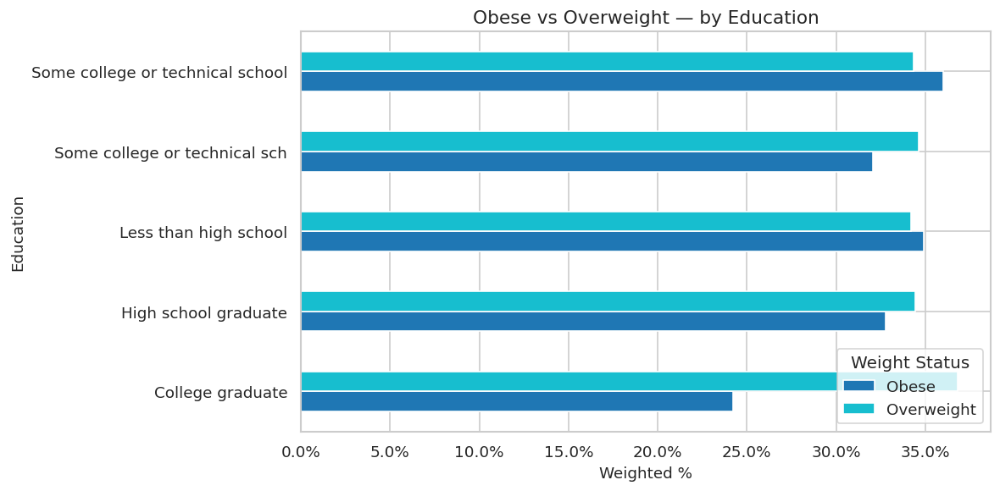

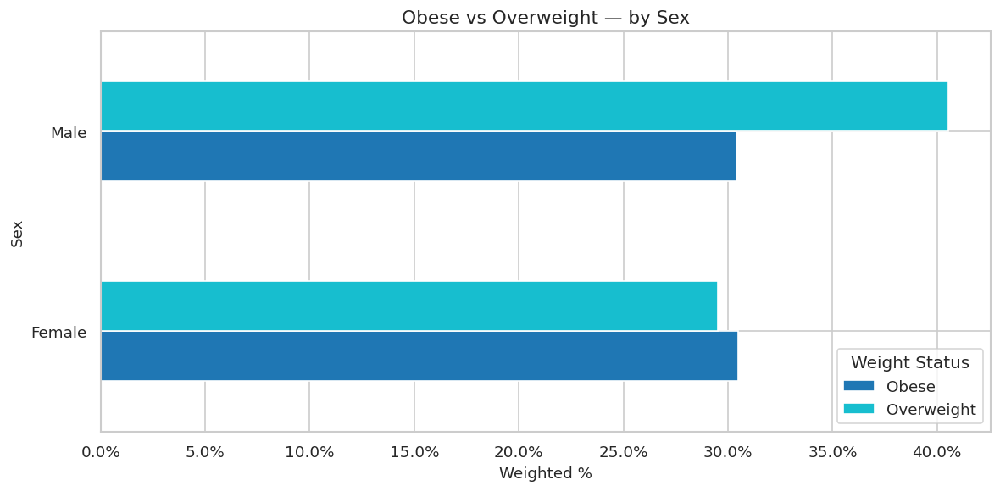

...

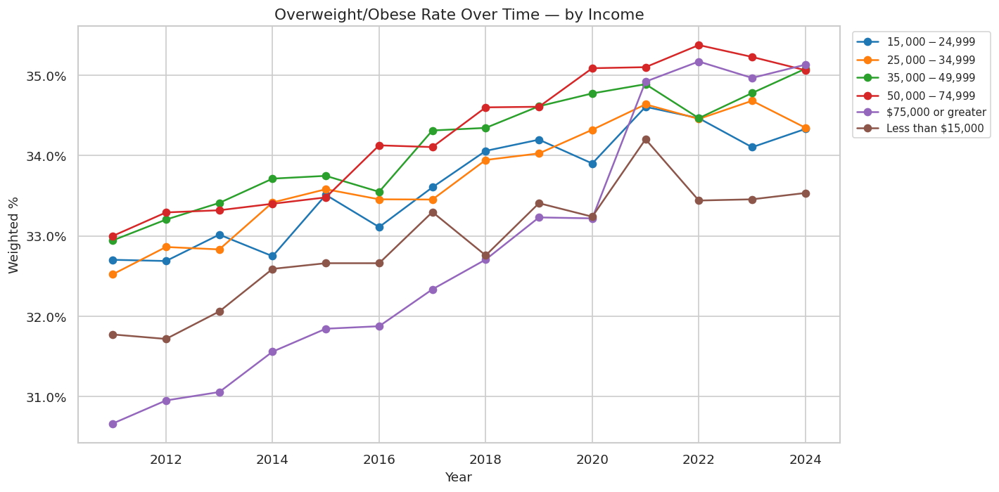

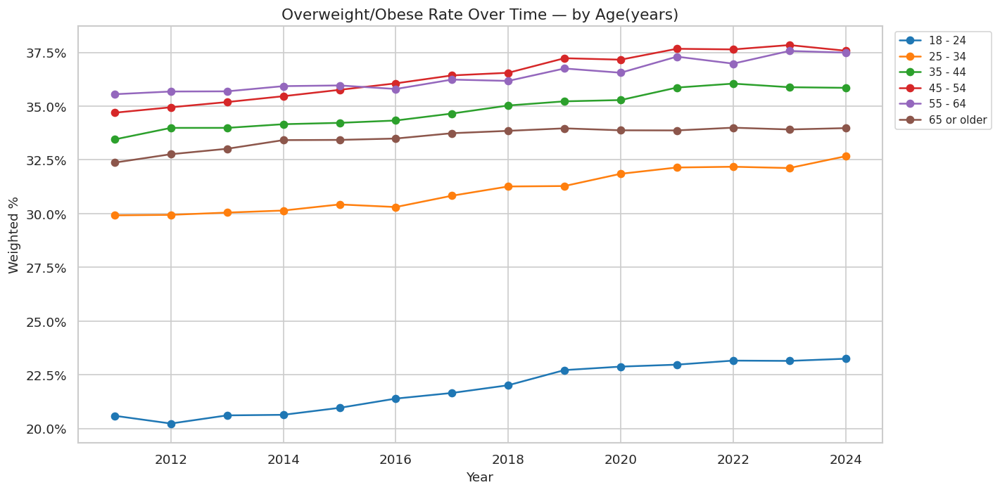

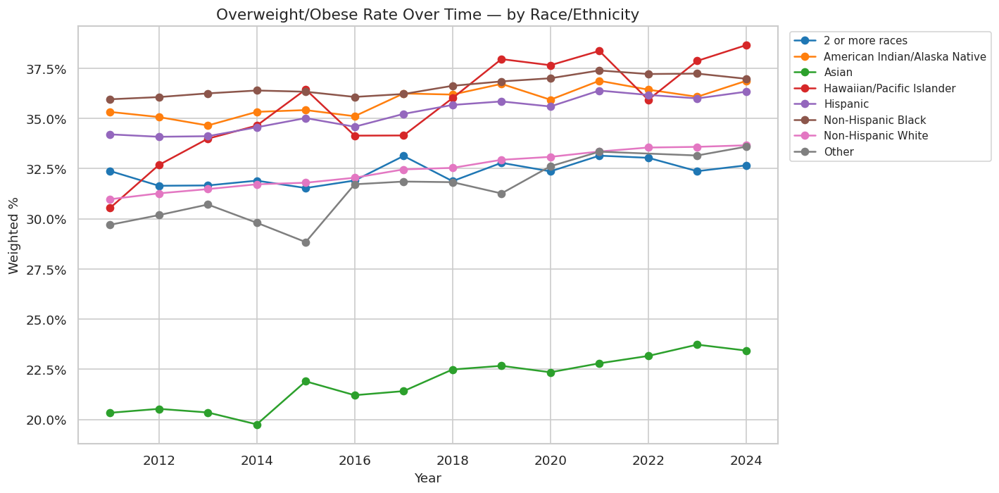

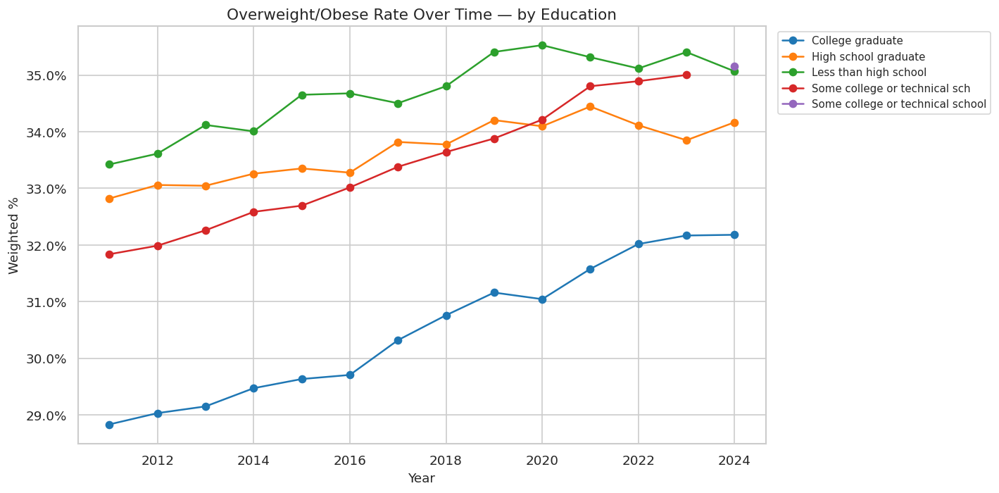

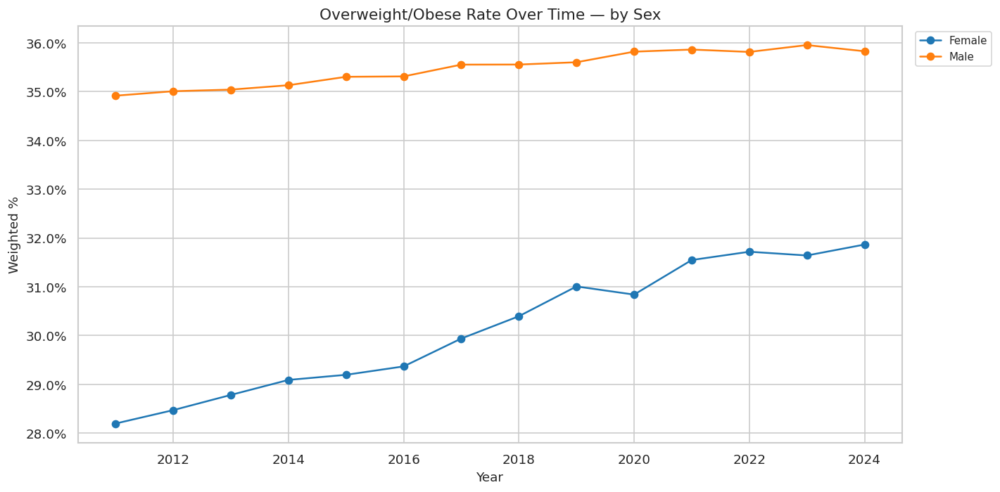

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 5 — HEALTHSTATUS EDA
# Weight status patterns across groups, states, and time
# ═════════════════════════════════════════════════════════════════════════════

print("HEALTHSTATUS EDA")

# ── Obese vs Overweight side by side — one chart per demographic group ────────
# Kept separate before combining downstream so each classification is visible
for grp in HealthStatus['Group'].unique():
    sub   = HealthStatus[HealthStatus['Group'] == grp]
    agg   = w_agg(sub, ['Group Value', 'Weight Status'])
    pivot = agg.pivot(index='Group Value', columns='Weight Status', values='Weighted %')
    fig, ax = plt.subplots(figsize=(10, 5))
    pivot.plot(kind='barh', ax=ax, colormap=PALETTE)
    ax.xaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set(title=f'Obese vs Overweight — by {grp}', xlabel='Weighted %', ylabel=grp)
    plt.tight_layout()
    plt.show()

# ── State-level combined rate colored by urbanicity ───────────────────────────
# Obese + Overweight averaged here — exact sum combination is in Cell 7
state_rate = (w_agg(
    HealthStatus[HealthStatus['Weight Status'].isin(['Obese','Overweight'])],
    ['State','Region'])
    .sort_values('Weighted %', ascending=True))

region_colors = dict(zip(state_rate['Region'].unique(),
                         sns.color_palette(PALETTE, state_rate['Region'].nunique())))

fig, ax = plt.subplots(figsize=(12, 14))
ax.barh(state_rate['State'], state_rate['Weighted %'],
        color=state_rate['Region'].map(region_colors))
ax.xaxis.set_major_formatter(mtick.PercentFormatter())
ax.set(title='Combined Overweight/Obese Rate by State', xlabel='Weighted %')
ax.legend(handles=[plt.Rectangle((0,0),1,1, color=v, label=k)
                   for k, v in region_colors.items()], title='Region', loc='lower right')
plt.tight_layout()
plt.show()

# ── Year-over-year trend — combined Overweight/Obese ─────────────────────────
for grp in HealthStatus['Group'].unique():
    sub = HealthStatus[
        (HealthStatus['Group'] == grp) &
        (HealthStatus['Weight Status'].isin(['Obese','Overweight']))
    ]
    trend_chart(w_agg(sub, ['Year','Group Value']), 'Group Value',
                title=f'Overweight/Obese Rate Over Time — by {grp}')

## **Initial Health Status Exploratory Data Analysis**

---

**Overview**

In this cell, I explore the distribution of weight status across demographics. Each bar chart represents a comparison over reports on overweigtht vs obese respondents, additionally sorting the combined status for each state and assessing the changes overtime for each demograhpic.


**Implementation**

Given the nature of the data (presentation by percentage and sample size), the charts utilize a weighted aggregate of the data, where percentage of sample sizes at each line are aggregated together. For state level data, a weighted state average is used to not allow heavly sampled states overpower states with small samples and provide a fair comparison on equal ground.


**Results**

Overall, some results meet expectations. A primary example of this would be the age affect on overweight/obese percentages as the younger ages appear in these tables to be the healthiest. Males being consistently lower than than Female rates align with the commonly accepted principle that it is more difficult for women to metabolize fat. However, there are some more curious takeaways here. For example, the fluctuations of income year after year and how overtime this information has converged more than other deomgraphics. Additionally, state level ranking would indicate that rural areas show more typical patterns of overweight/obesity percentages. However, we must acknowledge that this could very well be simply due to the weighting of the data and there may be a deeper story. From here, it would be intersting to see how exactly this information works together by first looking at health activites by demographics and seeing what patterns we can dive into deeper there.

HEALTHHABITS EDA


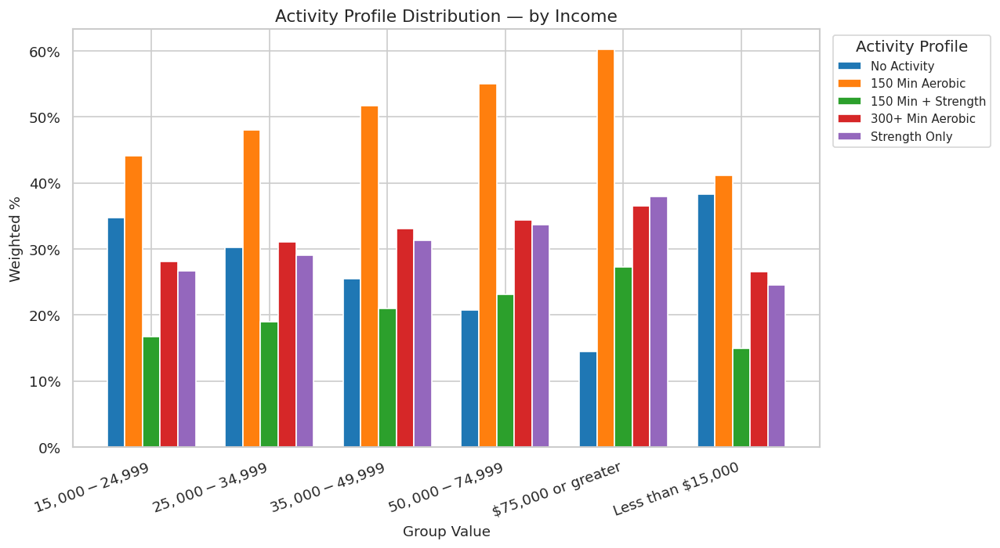

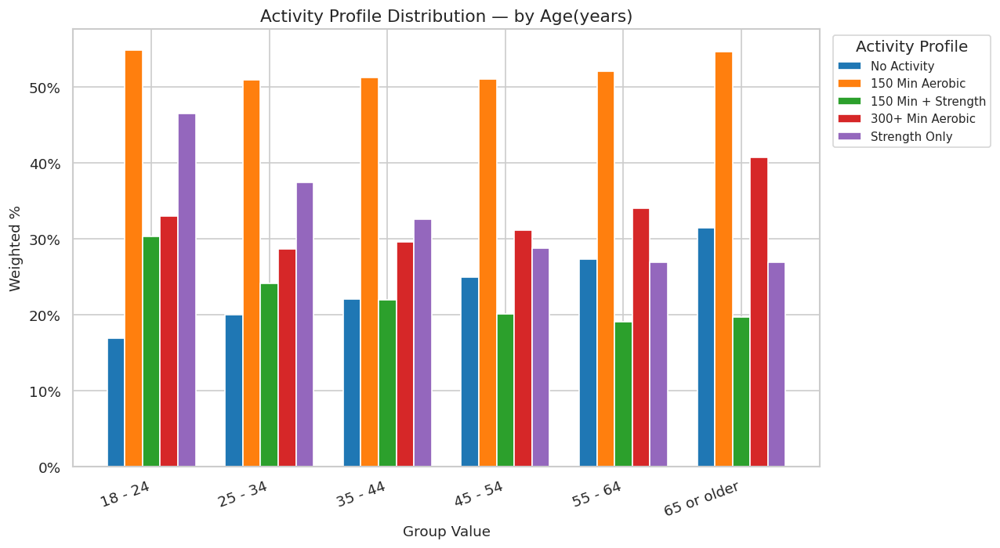

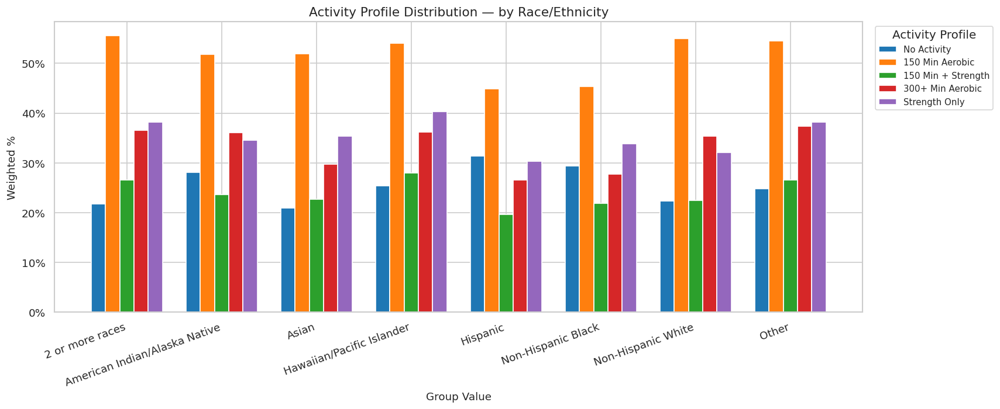

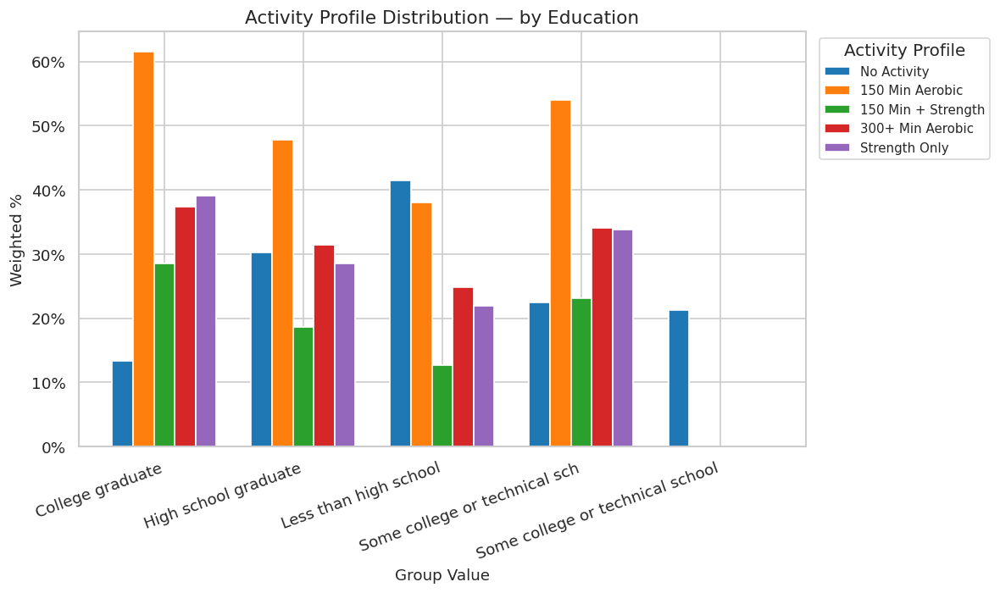

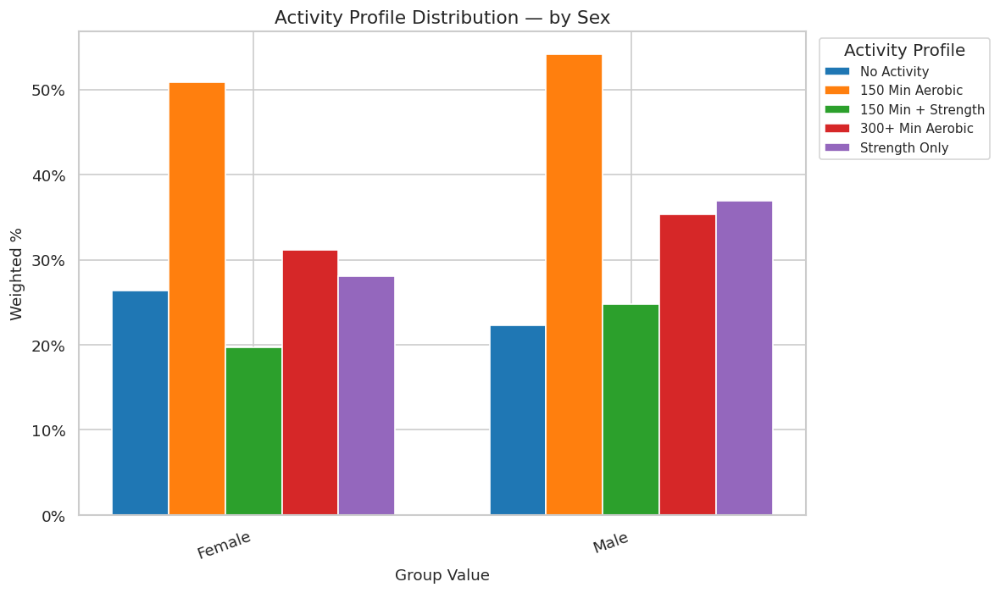

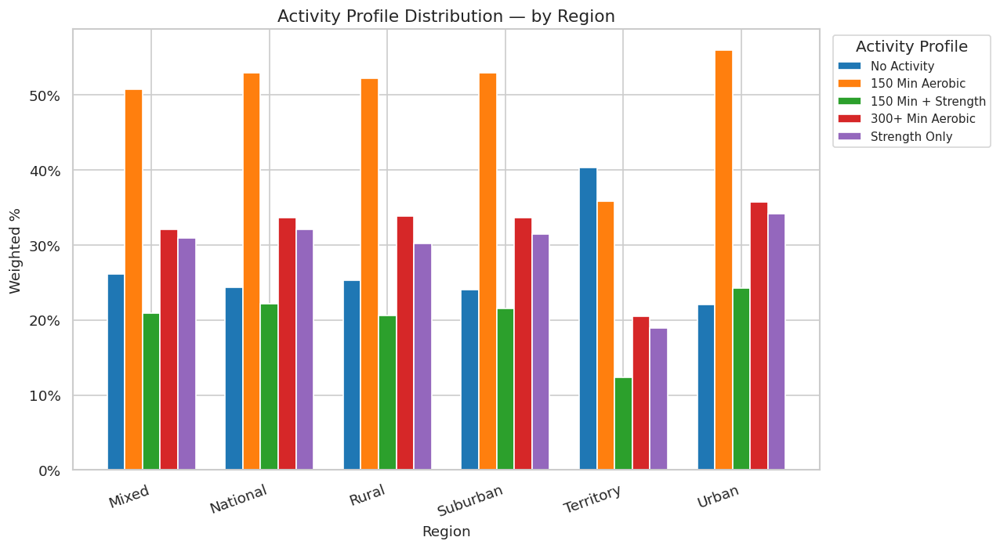


HEALTHDIET EDA


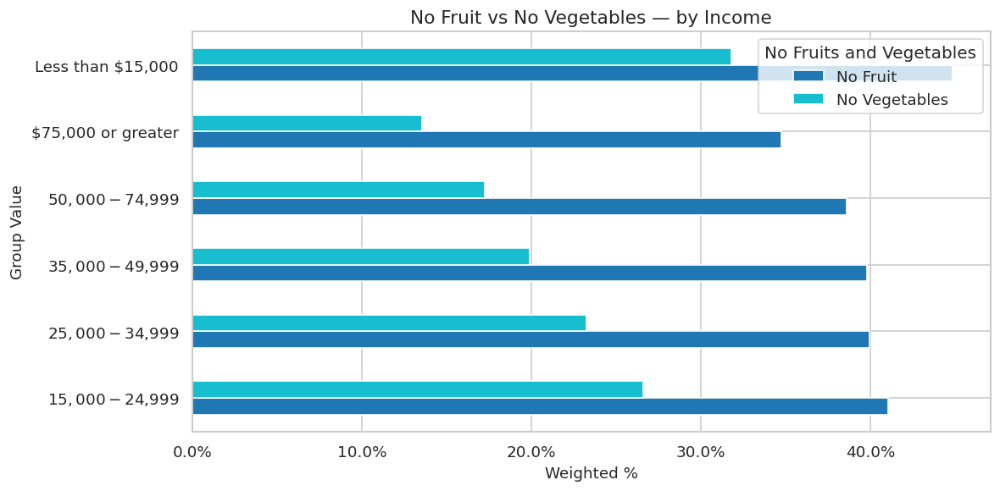

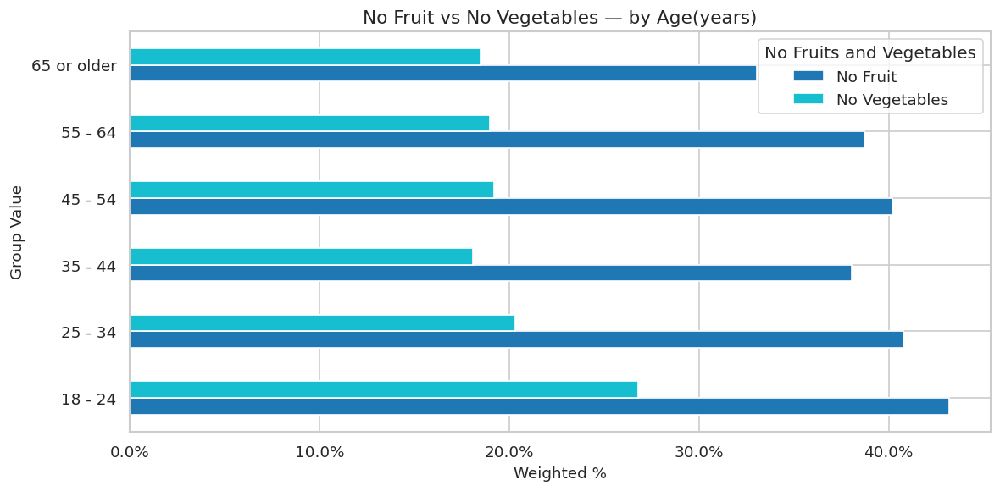

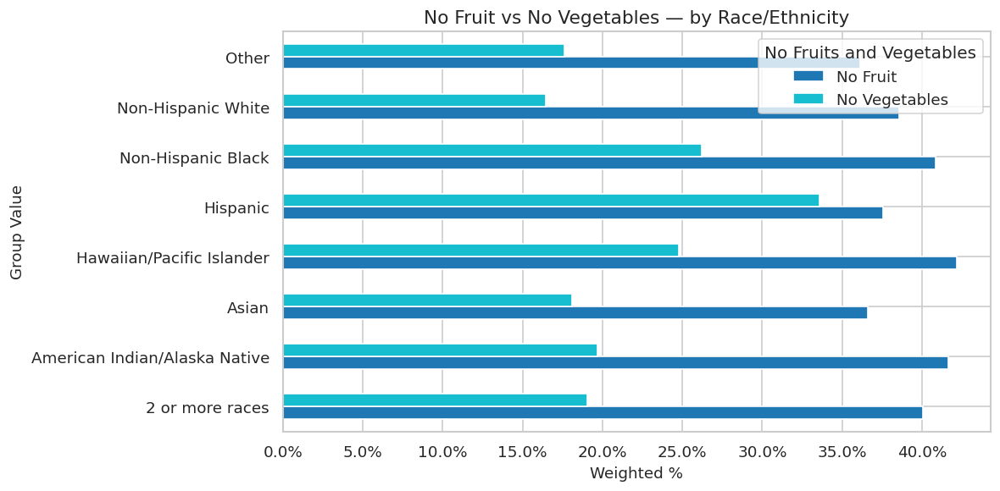

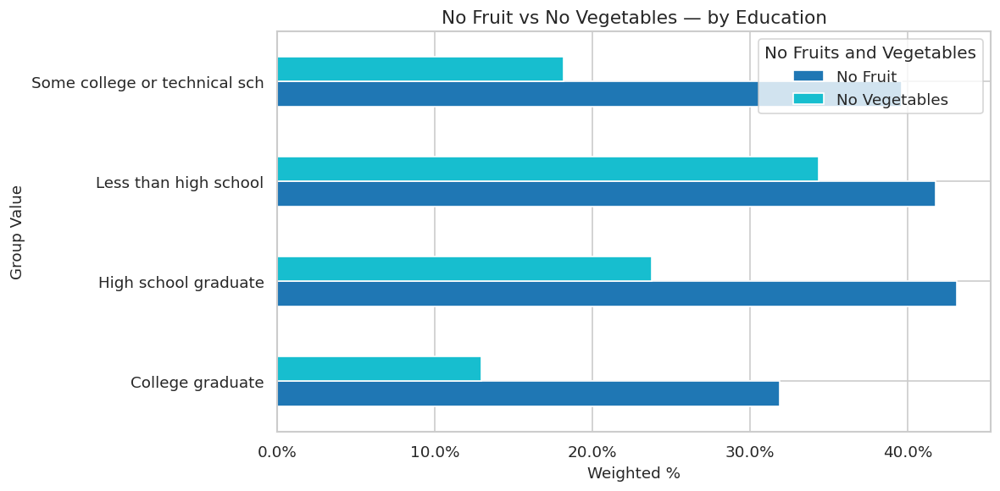

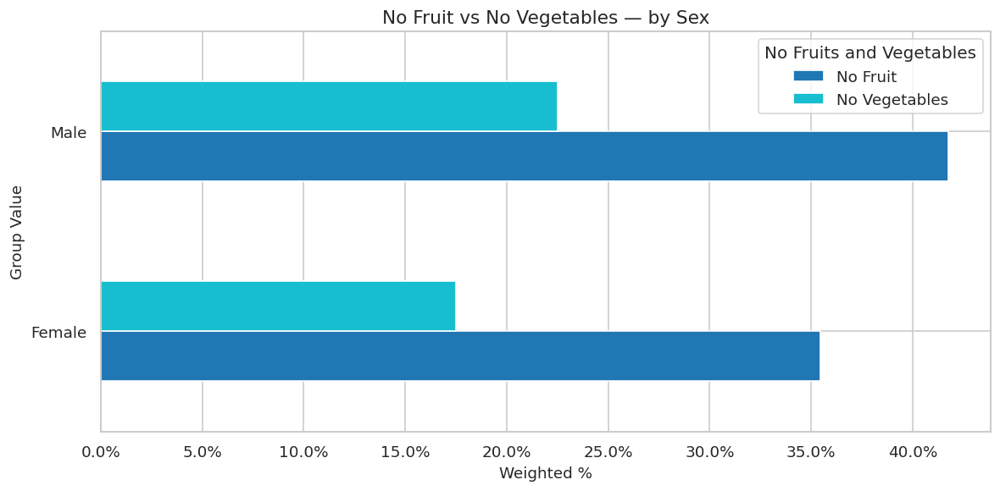

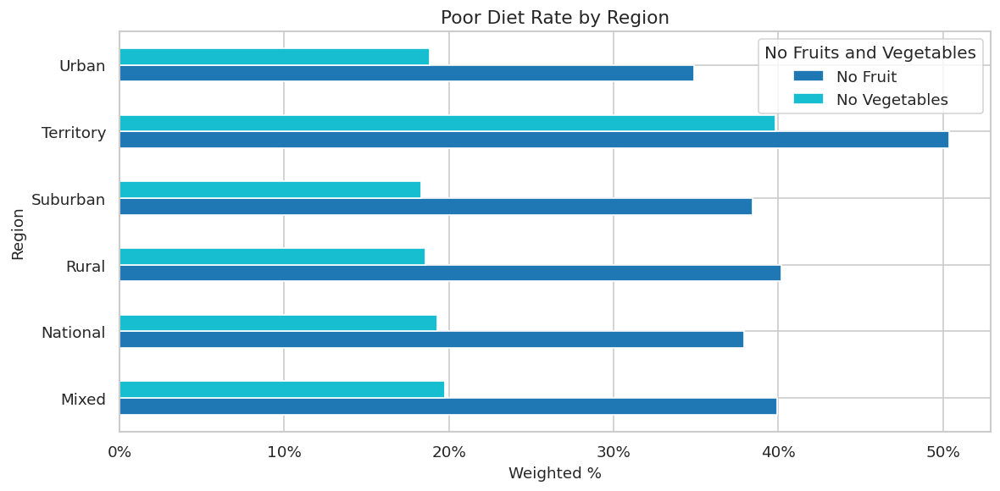

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 6 — HEALTHHABITS & HEALTHDIET EDA
# Activity profiles and diet patterns across groups and regions
# ═════════════════════════════════════════════════════════════════════════════

print("HEALTHHABITS EDA")

# Activity profiles ordered sedentary → most active for consistency across charts
PROFILE_ORDER = ['No Activity','150 Min Aerobic','150 Min + Strength',
                 '300+ Min Aerobic','Strength Only']

def activity_cluster_chart(data, group_col, title):
    """Clustered bar chart showing all 5 activity profiles for each group value."""
    agg   = w_agg(data, [group_col, 'Activity Profile'])
    pivot = (agg.pivot(index=group_col, columns='Activity Profile', values='Weighted %')
               .reindex(columns=PROFILE_ORDER).fillna(0))
    n     = len(pivot)
    x     = np.arange(n)
    w     = 0.15
    pal   = sns.color_palette(PALETTE, len(PROFILE_ORDER))
    fig, ax = plt.subplots(figsize=(max(10, n * 1.8), 6))
    for i, (prof, color) in enumerate(zip(PROFILE_ORDER, pal)):
        ax.bar(x + (i - len(PROFILE_ORDER)/2) * w + w/2,
               pivot[prof], width=w, label=prof, color=color)
    ax.set_xticks(x)
    ax.set_xticklabels(pivot.index, rotation=20, ha='right')
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set(title=title, ylabel='Weighted %', xlabel=group_col)
    ax.legend(title='Activity Profile', bbox_to_anchor=(1.01,1), loc='upper left', fontsize=9)
    plt.tight_layout()
    plt.show()

# One chart per demographic group
for grp in HealthHabits['Group'].unique():
    activity_cluster_chart(
        HealthHabits[HealthHabits['Group'] == grp],
        'Group Value', f'Activity Profile Distribution — by {grp}'
    )

# One chart for Region
activity_cluster_chart(HealthHabits, 'Region', 'Activity Profile Distribution — by Region')

print("\nHEALTHDIET EDA")

def diet_chart(data, group_col, title):
    """Horizontal bar chart — No Fruit vs No Vegetables for each group value."""
    agg   = w_agg(data, [group_col, 'No Fruits and Vegetables'])
    pivot = agg.pivot(index=group_col, columns='No Fruits and Vegetables',
                      values='Weighted %').fillna(0)
    fig, ax = plt.subplots(figsize=(10, 5))
    pivot.plot(kind='barh', ax=ax, colormap=PALETTE)
    ax.xaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set(title=title, xlabel='Weighted %')
    plt.tight_layout()
    plt.show()

for grp in HealthDiet['Group'].unique():
    diet_chart(HealthDiet[HealthDiet['Group'] == grp],
               'Group Value', f'No Fruit vs No Vegetables — by {grp}')

diet_chart(HealthDiet, 'Region', 'Poor Diet Rate by Region')

## **Initial Health Habit Exploratory Data Analysis**

---


**Overview**

Here, I am breaking down the dietary habits for each demographic to see which ones yield the most interesting dynamics. Specifically, health activities such as strength training and aerobic exercise or diets such as fruit and/or vegitable intake.

**Implementation**

I again use a weighted aggregate here using the percentages of sample sizes provided for each demographic of the category groups.

**Results**

One of the key takeaways here is the signifant difference in dietary habits across age and income charts, in addition, income also show many differences for each grade in health activities. This is inline with the expectations from my exploration of the Health Status data, as those were the demographics that popped out there as well. Lastly, as we can also tell by both steps, region has a notable impact, where we can see different variable amounts of activity across demographics under this scope, too.


In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 7 — PROFILE TABLE
#
# One row per [Year, State, Region, Group, Group Value] with all 7 metrics.
#
# Overweight/Obese combination:
#   Obese and Overweight are mutually exclusive BMI categories from the same
#   survey sample. Combined % = Obese% + Overweight% (mathematically exact sum).
#   Confirmed: sums never exceed 100% (mean ~66%), so ~34% of each sample is
#   normal/underweight — not captured in this dataset.
#   Combined sample size = harmonic mean of the two effective sample sizes
#   (conservative — avoids double counting the same respondents).
#
# All 7 metrics joined via inner join on shared key columns.
# Harmonic Weight = minimum pairwise harmonic mean across all 7 sample sizes.
# Reliable flag   = True when every metric's sample size >= 100.
# ═════════════════════════════════════════════════════════════════════════════

KEY = ['Year','State','Region','Group','Group Value']


def build_metric(df, filter_col, filter_val, name):
    """Aggregate one metric to KEY level with weighted mean % and total n."""
    sub     = df[df[filter_col] == filter_val].copy()
    records = []
    for keys, grp in sub.groupby(KEY):
        kt = keys if isinstance(keys, tuple) else (keys,)
        records.append(dict(zip(KEY, kt)) | {
            name        : np.average(grp['Percentage'], weights=grp['Sample Size']),
            f'{name}_N' : grp['Sample Size'].sum(),
        })
    return pd.DataFrame(records)


def build_ow_ob(df, name='Overweight/Obese %'):
    """
    Combine Obese% + Overweight% via sum (mutually exclusive categories).
    Sample size = harmonic mean of the two effective sample sizes.
    """
    records = []
    for keys, grp in df[df['Weight Status'].isin(['Obese','Overweight'])].groupby(KEY):
        kt        = keys if isinstance(keys, tuple) else (keys,)
        ob_rows   = grp[grp['Weight Status'] == 'Obese']
        ow_rows   = grp[grp['Weight Status'] == 'Overweight']
        if ob_rows.empty or ow_rows.empty:
            continue
        ob_pct = np.average(ob_rows['Percentage'], weights=ob_rows['Sample Size'])
        ob_n   = ob_rows['Sample Size'].sum()
        ow_pct = np.average(ow_rows['Percentage'], weights=ow_rows['Sample Size'])
        ow_n   = ow_rows['Sample Size'].sum()
        records.append(dict(zip(KEY, kt)) | {
            name        : ob_pct + ow_pct,       # exact sum for mutually exclusive categories
            f'{name}_N' : harmonic(ob_n, ow_n),  # conservative combined sample size
        })
    return pd.DataFrame(records)


# Build each metric profile
ow_ob    = build_ow_ob(HealthStatus)
no_act   = build_metric(HealthHabits, 'Activity Profile', 'No Activity',        'No Activity %')
m150     = build_metric(HealthHabits, 'Activity Profile', '150 Min Aerobic',    'Meets 150 Min %')
str_only = build_metric(HealthHabits, 'Activity Profile', 'Strength Only',      'Strength Only %')
str_aer  = build_metric(HealthHabits, 'Activity Profile', '150 Min + Strength', 'Strength + Aerobic %')
no_fruit = build_metric(HealthDiet,   'No Fruits and Vegetables', 'No Fruit',      'No Fruit %')
no_veg   = build_metric(HealthDiet,   'No Fruits and Vegetables', 'No Vegetables', 'No Vegetables %')

# Inner join all metrics — only keep rows with complete data across all 7
profile = ow_ob
for df_m in [no_act, m150, str_only, str_aer, no_fruit, no_veg]:
    profile = profile.merge(df_m, on=KEY, how='inner')

# Sample size columns — _N suffix prevents substring matching issues
N_COLS = ['Overweight/Obese %_N','No Activity %_N','Meets 150 Min %_N',
          'Strength Only %_N','Strength + Aerobic %_N','No Fruit %_N','No Vegetables %_N']

# Conservative harmonic weight — minimum pairwise harmonic mean across all 7 metrics
profile['Harmonic Weight'] = profile.apply(
    lambda r: min(harmonic(r[a], r[b])
                  for i, a in enumerate(N_COLS)
                  for b in N_COLS[i+1:]), axis=1
)

# Reliable = all metric sample sizes >= 100
profile['Reliable'] = profile[N_COLS].min(axis=1) >= 100

METRICS = ['Overweight/Obese %','No Activity %','Meets 150 Min %',
           'Strength Only %','Strength + Aerobic %','No Fruit %','No Vegetables %']

print(f"Profile table   : {profile.shape[0]:,} rows × {profile.shape[1]} cols")
print(f"Reliable rows   : {profile['Reliable'].sum():,} ({profile['Reliable'].mean()*100:.1f}%)")
print(f"\nOverweight/Obese % (should average ~66%):")
print(profile['Overweight/Obese %'].describe().round(1).to_string())

Profile table   : 2,485 rows × 21 cols
Reliable rows   : 2,344 (94.3%)

Overweight/Obese % (should average ~66%):
count    2485.0
mean       66.2
std         8.4
min        24.9
25%        63.4
50%        67.7
75%        71.4
max        84.9


## **Profile Table Compilation**

---

**Overview**

This cell is a key step across the rest of this project. Categories in health activity with multiple pieces of information have been parsed to track more detailed attributes. For example, rather than one column stating someone does stength training and aerobic exercise, there are two boolean columns stating True for both strength training and aerobics. This creates a total of 7 columns:

*   Overwight/Obese
*   No Activity
*   Meets 150 Min
*   Stength Only
*   Strength + Aerobic
*   No Fruit
*   No Vegitables

In a new table, a row is created for a given demographic value (income, age, region) in a given year (2011 - 2024) and contains standardized boolean value columns for each of the 7 health variables. This alows for a consistent, efficient method of deriving calculations and and visualizing results. One fact to consider though is the large numerous amounts of variable sample sizes and percentages for each seperate health variable per demographic, so these need to be unified in this profile table. Essential, the goal is creating the different health profiles attriubted to each demographic.


**Implementation**

To consider the wide array of data sample and variant percentages of each demographic and their health statuses, I use harmonic weight to create a unified value that is reliable for analysis. This uses the minimum harmonic mean across the 7 health attributes for a demogrpahic, and uses this metricin order to account for the weak peace of data compared to the strongest, to ensure accuracy. This makes it to where results will not be skewed by normally overpowering sizes of data. These means are derived using aggregate metric data that establishes sample size weighted means joined on a key created for groups of records. Lastly, I used a reliability threshold of n=30 to ensure that rows are aggregated on enough information to be deamed useful and not skew final results. Overweight and Obesity, as shown above were also lumped together int he same category for more impactful results and easier calculations.

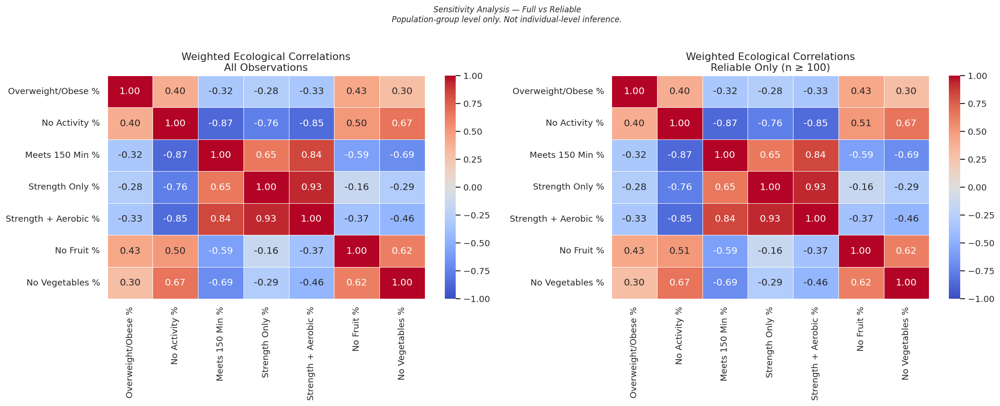


Correlation shifts > 0.05 (full vs reliable):
  None — findings are robust across full and reliable subsets.


In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 8 — WEIGHTED ECOLOGICAL CORRELATIONS
#
# All correlations are at the population-group level (ecological).
# Individual-level inference is not supported — this is not causal.
# Sensitivity check: full dataset vs reliable-only (n>=100 all metrics).
# ═════════════════════════════════════════════════════════════════════════════

def corr_matrix(df, metrics, w_col='Harmonic Weight'):
    """Pairwise weighted Pearson correlation matrix."""
    df  = df.reset_index(drop=True).copy()
    mat = np.full((len(metrics), len(metrics)), np.nan)
    for i, m1 in enumerate(metrics):
        for j, m2 in enumerate(metrics):
            mask = df[m1].notna() & df[m2].notna() & df[w_col].notna()
            if mask.sum() < 5:
                continue
            mat[i, j] = w_pearson(
                df.loc[mask, m1].to_numpy(dtype=float),
                df.loc[mask, m2].to_numpy(dtype=float),
                df.loc[mask, w_col].to_numpy(dtype=float)
            )
    return pd.DataFrame(mat, index=metrics, columns=metrics)


corr_all  = corr_matrix(profile, METRICS)
corr_rel  = corr_matrix(profile[profile['Reliable']].reset_index(drop=True), METRICS)

# Side-by-side: full vs reliable-only
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for ax, corr, title in zip(axes, [corr_all, corr_rel],
                            ['All Observations', 'Reliable Only (n ≥ 100)']):
    sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm',
                center=0, linewidths=0.5, ax=ax, vmin=-1, vmax=1)
    ax.set_title(f'Weighted Ecological Correlations\n{title}')

plt.suptitle('Sensitivity Analysis — Full vs Reliable\n'
             'Population-group level only. Not individual-level inference.',
             fontsize=10, style='italic', y=1.02)
plt.tight_layout()
plt.show()

# Flag any notable shifts between full and reliable-only
print("\nCorrelation shifts > 0.05 (full vs reliable):")
notable = [(m1, m2, abs(corr_rel.loc[m1,m2] - corr_all.loc[m1,m2]))
           for m1 in METRICS for m2 in METRICS if m1 < m2
           if abs(corr_rel.loc[m1,m2] - corr_all.loc[m1,m2]) > 0.05]
if notable:
    for m1, m2, d in notable:
        print(f"  {m1} vs {m2}: Δ={d:.2f}")
else:
    print("  None — findings are robust across full and reliable subsets.")

## **Ecological Correlations**

---

Here, I am looking into associations between health habits. Primarily the goal here isn't to find information but to ensure that the results are in fact reliable with the new framing of the data at an ecological (population) level through a sensitivity analysis. After creating a Pearson coorelation matrix, I remove data marked unreliable by the algorithm. If there is more than a 5% change between points in the matrix, we know that there is an issue with the new profile table. I had success as it turned out that no unreliable shifts were found.

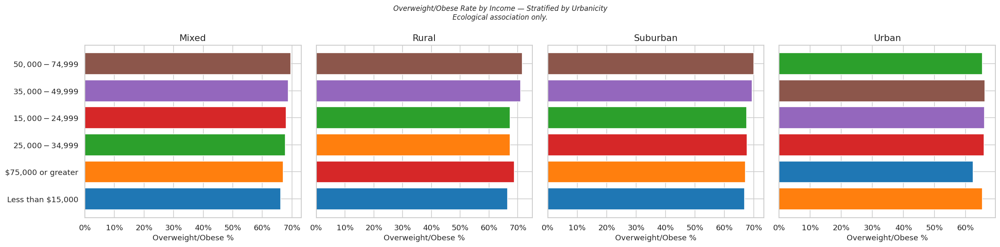


Weighted r (Income rank vs Overweight/Obese %) by Urbanicity:
  Mixed        : r = 0.034
  Rural        : r = 0.222
  Suburban     : r = 0.047
  Urban        : r = -0.312


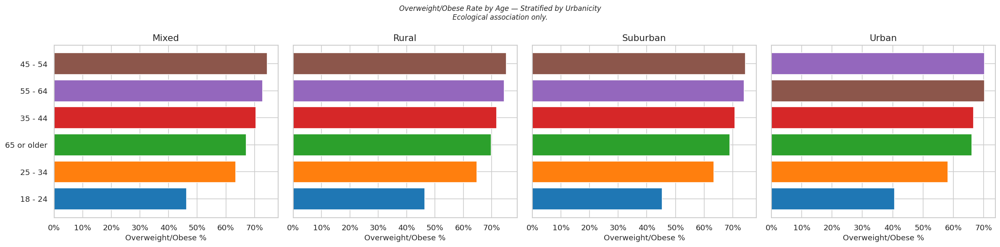

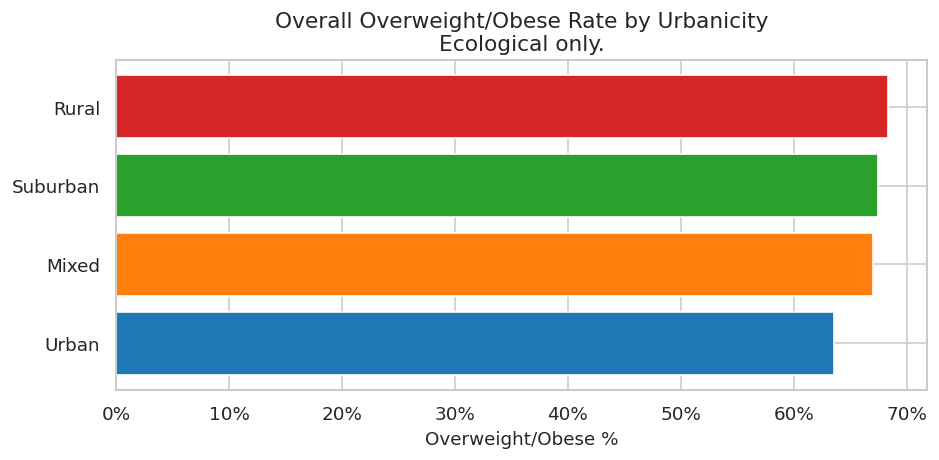

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 9 — STRATIFIED ASSOCIATION ANALYSIS
#
# Focus groups: Income, Age, Region
# Tests whether the demographic-weight relationship varies by urbanicity.
# All associations are ecological — conditional on group context.
# ═════════════════════════════════════════════════════════════════════════════

# Urbanicity levels for stratification (exclude national aggregates)
URB = [u for u in profile['Region'].unique() if u not in ['National','Territory']]

# Income ordered low → high for correlation calculation
INCOME_RANK = {
    'Less than $15,000':0, '$15,000 - $24,999':1, '$25,000 - $34,999':2,
    '$35,000 - $49,999':3, '$50,000 - $74,999':4, '$75,000 or greater':5,
}


def stratified_bars(df, group_col, metric, urb_levels, title):
    """Horizontal bar charts of metric by group value, one panel per urbanicity."""
    fig, axes = plt.subplots(1, len(urb_levels),
                             figsize=(5 * len(urb_levels), 5), sharey=True)
    for ax, urb in zip(axes, urb_levels):
        sub = df[df['Region'] == urb]
        if sub.empty:
            ax.set_visible(False)
            continue
        agg = w_agg(sub, ['Group Value'], value_col=metric,
                    weight_col='Harmonic Weight').sort_values('Weighted %', ascending=True)
        ax.barh(agg['Group Value'], agg['Weighted %'],
                color=sns.color_palette(PALETTE, len(agg)))
        ax.xaxis.set_major_formatter(mtick.PercentFormatter())
        ax.set(title=urb, xlabel=metric)
    fig.suptitle(f'{title}\nEcological association only.',
                 fontsize=10, style='italic')
    plt.tight_layout()
    plt.show()


# ── Income × Overweight/Obese ─────────────────────────────────────────────────
income_df = profile[profile['Group'] == 'Income'].reset_index(drop=True)
stratified_bars(income_df, 'Group Value', 'Overweight/Obese %', URB,
                'Overweight/Obese Rate by Income — Stratified by Urbanicity')

print("\nWeighted r (Income rank vs Overweight/Obese %) by Urbanicity:")
for urb in URB:
    sub = (income_df[(income_df['Region'] == urb) &
                     (income_df['Group Value'].isin(INCOME_RANK))]
           .dropna(subset=['Overweight/Obese %','Harmonic Weight'])
           .reset_index(drop=True))
    if len(sub) < 5:
        continue
    r = w_pearson(sub['Group Value'].map(INCOME_RANK).to_numpy(dtype=float),
                  sub['Overweight/Obese %'].to_numpy(dtype=float),
                  sub['Harmonic Weight'].to_numpy(dtype=float))
    print(f"  {urb:12s} : r = {r:.3f}")

# ── Age × Overweight/Obese ────────────────────────────────────────────────────
age_df = profile[profile['Group'] == 'Age(years)'].reset_index(drop=True)
stratified_bars(age_df, 'Group Value', 'Overweight/Obese %', URB,
                'Overweight/Obese Rate by Age — Stratified by Urbanicity')

# ── Region summary ────────────────────────────────────────────────────────────
region_agg = (w_agg(profile[profile['Region'].isin(URB)],
                    ['Region'], value_col='Overweight/Obese %',
                    weight_col='Harmonic Weight')
              .sort_values('Weighted %', ascending=True))

fig, ax = plt.subplots(figsize=(8, 4))
ax.barh(region_agg['Region'], region_agg['Weighted %'],
        color=sns.color_palette(PALETTE, len(region_agg)))
ax.xaxis.set_major_formatter(mtick.PercentFormatter())
ax.set(title='Overall Overweight/Obese Rate by Urbanicity\nEcological only.',
       xlabel='Overweight/Obese %')
plt.tight_layout()
plt.show()

## **Association Analysis**

---

**Overview**

Now that we have a standardized profile table, we can revisit the previous results. I found that age and income are two of the most compelling points of interest, but how are these affected by the 3rd, universal point of interest that was found (region)?


**Implementation**

For each region, I look at the individual demographic level rankings based on weight prevalence as well as measured Pierson coorelations.

**Results**

Here, we can see that there is an inverse relationship strictly between obesity and urban areas, but a positive relationship with rural areas. Evidence of this can be seen in how demographic rankings move depending on urbanicity. Most notably, those that are better off in rural areas with less income appear to be worse off as they move towards urban areas. This is actually opposing to what I saw earlier, where rural areas, had higher rates of obesity. This implies that there is a difference in a demographic's obesity rates dependent on their location. However, the reason for this is still unclear, so let's explore that by digging into health activity data further.

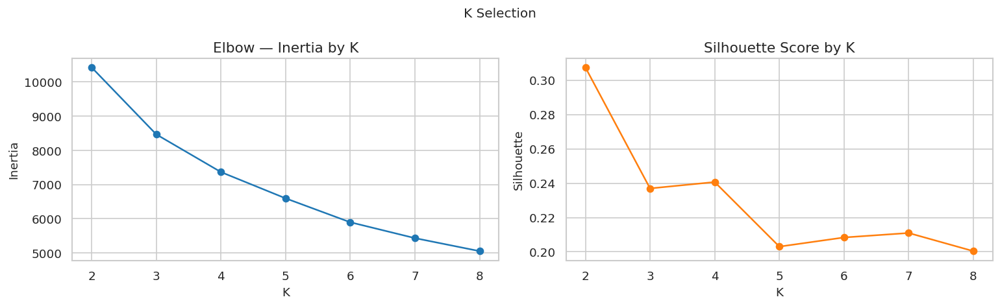


Cluster mean profiles:
         Overweight/Obese %  No Activity %  Meets 150 Min %  Strength Only %  Strength + Aerobic %  No Fruit %  No Vegetables %
Cluster                                                                                                                        
0                      69.8           30.0             47.3             30.5                  19.3        40.2             20.8
1                      65.2           20.9             56.7             36.2                  25.1        35.1             16.3
2                      45.8           19.8             52.7             42.8                  26.8        39.4             22.2
3                      69.2           40.9             36.9             22.9                  13.0        45.1             30.8


In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 10 — K-MEANS CLUSTERING
#
# Clusters on reliable rows only (all metric sample sizes >= 100).
# StandardScaler required before k-means — Euclidean distance is scale-sensitive.
# K selected via elbow + silhouette. random_state=42 for reproducibility.
# Clusters describe co-occurring population health profiles. Not causal.
# ═════════════════════════════════════════════════════════════════════════════

# Reliable rows only — prevents sampling noise from influencing cluster boundaries
cluster_df = (profile[profile['Reliable']]
              .dropna(subset=METRICS)
              .reset_index(drop=True)
              .copy())

# Standardize all 7 metrics to mean=0, std=1 before clustering
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(cluster_df[METRICS])

# ── K selection: elbow + silhouette ───────────────────────────────────────────
inertias, silhouettes = [], []
for k in range(2, 9):
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    lbl = km.fit_predict(X_scaled)
    inertias.append(km.inertia_)
    silhouettes.append(silhouette_score(X_scaled, lbl))

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].plot(range(2,9), inertias,   marker='o', color=sns.color_palette(PALETTE)[0])
axes[1].plot(range(2,9), silhouettes, marker='o', color=sns.color_palette(PALETTE)[1])
axes[0].set(title='Elbow — Inertia by K',          xlabel='K', ylabel='Inertia')
axes[1].set(title='Silhouette Score by K',          xlabel='K', ylabel='Silhouette')
plt.suptitle('K Selection', fontsize=12)
plt.tight_layout()
plt.show()

# ── Fit final model (adjust K if elbow/silhouette suggest otherwise) ──────────
K = 4
km_final              = KMeans(n_clusters=K, random_state=42, n_init=10)
cluster_df['Cluster'] = km_final.fit_predict(X_scaled)

cluster_summary = cluster_df.groupby('Cluster')[METRICS].mean().round(1)
print("\nCluster mean profiles:")
print(cluster_summary.to_string())

## **K-Means Clustering**

---

**Overview**

In this cell, I perform the necessary setup to find the prominent clusters associated with this dataset based on health behaviors and weight status profiles.

**Implementation**

This is done using the sklearn library within Python. Using this, I use the elbow method to determine at what point adding clusters no longer has meaningful convergence, taking silhouette score into account to determine what points belong with cluster centroids over others, since these clusters can yield similar results at times. I used paramters:


*   random_state = 42 to set random jumps
*   n_init = 10 to set the occurence of random jumps

**Results**

This results in 4 clusters:

*   Sedentary and Overwight
*   Active and Overweight
*   Healthy Weight
*   Inactive, Poor Diet and Overweight

More detail on these cluster profiles can be seen in cell 10B.



CLUSTER RANKINGS  (1 = worst outcome on each metric)
         Overweight/Obese %  No Activity %  No Fruit %  No Vegetables %  Meets 150 Min %  Strength Only %  Strength + Aerobic %  Total Risk Score
Cluster                                                                                                                                          
0                         1              2           2                3                2                2                     2                14
1                         3              3           4                4                4                3                     3                24
2                         4              4           3                2                3                4                     4                24
3                         2              1           1                1                1                1                     1                 8

Total Risk Score (lower = worse overall health profile):
Cluster
3    

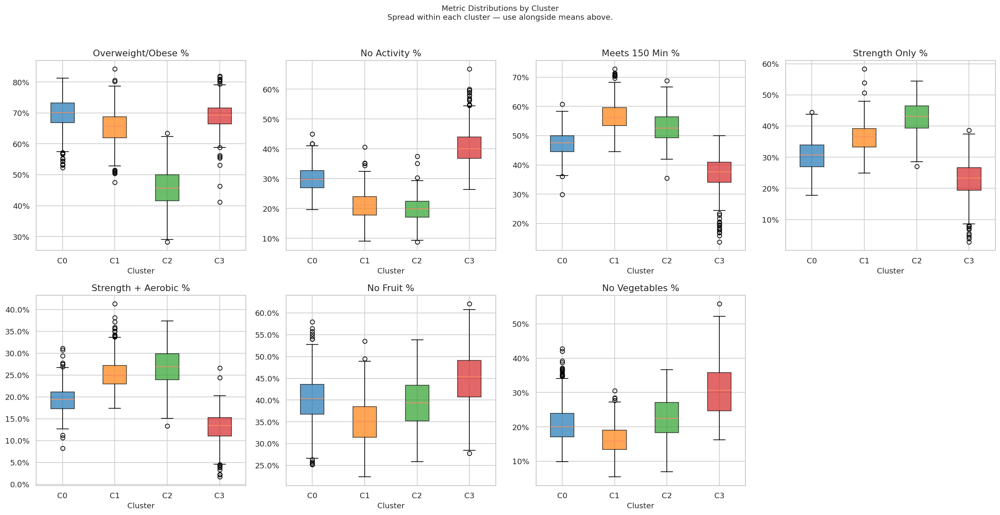

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 10b — CLUSTER PROFILE DIAGNOSTIC
#
# Systematically interprets clusters before assigning labels.
# Rankings, risk scores, and demographic composition all shown clearly.
# Includes distribution boxplots so profiles are fully characterized here.
# ═════════════════════════════════════════════════════════════════════════════

from sklearn.metrics import pairwise_distances

# ── Ranked profiles ───────────────────────────────────────────────────────────
# Rank 1 = worst outcome on that metric
RISK_METRICS  = ['Overweight/Obese %','No Activity %','No Fruit %','No Vegetables %']
PROT_METRICS  = ['Meets 150 Min %','Strength Only %','Strength + Aerobic %']

ranks = pd.DataFrame(index=cluster_summary.index)
for col in RISK_METRICS:
    ranks[col] = cluster_summary[col].rank(ascending=False).astype(int)
for col in PROT_METRICS:
    ranks[col] = cluster_summary[col].rank(ascending=True).astype(int)
ranks['Total Risk Score'] = ranks.sum(axis=1)

print("=" * 60)
print("CLUSTER RANKINGS  (1 = worst outcome on each metric)")
print("=" * 60)
print(ranks.to_string())

print("\nTotal Risk Score (lower = worse overall health profile):")
print(ranks['Total Risk Score'].sort_values().to_string())

# ── Cluster means ─────────────────────────────────────────────────────────────
print("\n" + "=" * 60)
print("CLUSTER MEAN PROFILES")
print("=" * 60)
print(cluster_summary.to_string())


# ── Most common demographic values per cluster ────────────────────────────────
print("\n" + "=" * 60)
print("DOMINANT GROUP VALUES PER CLUSTER")
print("=" * 60)
for c in sorted(cluster_df['Cluster'].unique()):
    sub = cluster_df[cluster_df['Cluster'] == c]
    top = (sub.groupby(['Group','Group Value']).size()
             .reset_index(name='n')
             .sort_values('n', ascending=False)
             .head(8))
    print(f"\n  Cluster {c}  "
          f"(n={len(sub):,}  "
          f"OW/OB={cluster_summary.loc[c,'Overweight/Obese %']:.1f}%  "
          f"NoAct={cluster_summary.loc[c,'No Activity %']:.1f}%  "
          f"Meets150={cluster_summary.loc[c,'Meets 150 Min %']:.1f}%)")
    for _, r in top.iterrows():
        print(f"    {r['Group']:18s}: {r['Group Value']} ({r['n']} rows)")

# ── Distribution boxplots ─────────────────────────────────────────────────────
# Shown here so cluster profiles are fully characterized before labeling
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()
pal  = sns.color_palette(PALETTE, K)

for ax, metric in zip(axes, METRICS):
    data = [cluster_df[cluster_df['Cluster'] == c][metric].dropna().values
            for c in range(K)]
    bp = ax.boxplot(data, patch_artist=True)
    for patch, color in zip(bp['boxes'], pal):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    ax.set_xticklabels([f'C{i}' for i in range(K)])
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set(title=metric, xlabel='Cluster')

for ax in axes[len(METRICS):]:
    ax.set_visible(False)

fig.suptitle('Metric Distributions by Cluster\n'
             'Spread within each cluster — use alongside means above.',
             fontsize=11, y=1.02)
plt.tight_layout()
plt.show()

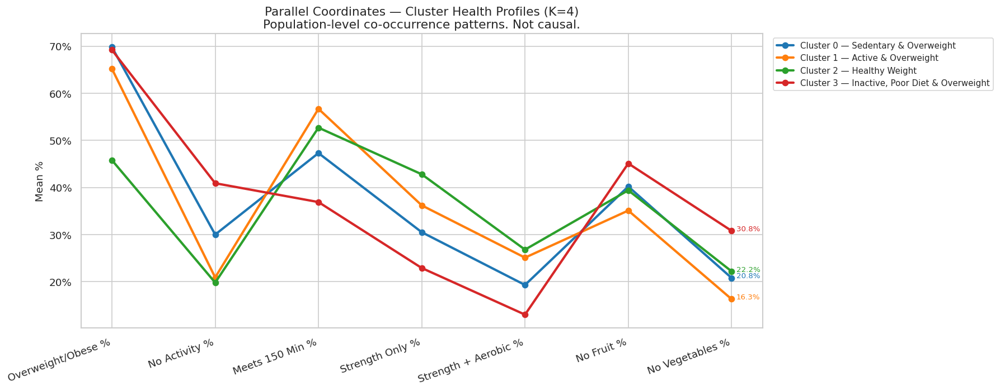

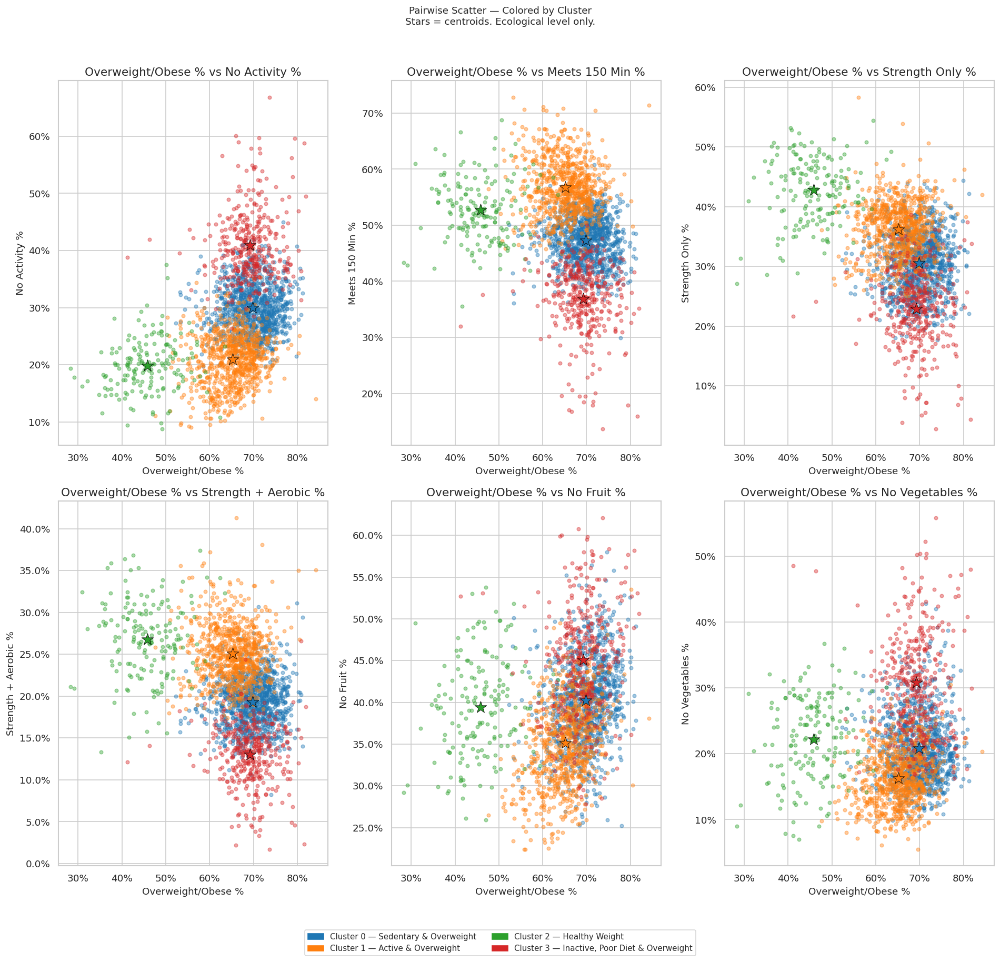

In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 11 — CLUSTER VISUALIZATIONS
#
# Labels assigned from Cell 10b diagnostic.
# Update CLUSTER_LABELS if K or cluster order changes.
# ═════════════════════════════════════════════════════════════════════════════

CLUSTER_LABELS = {
    0: 'Cluster 0 — Sedentary & Overweight',
    1: 'Cluster 1 — Active & Overweight',
    2: 'Cluster 2 — Healthy Weight',
    3: 'Cluster 3 — Inactive, Poor Diet & Overweight',
}
cluster_df['Label'] = cluster_df['Cluster'].map(CLUSTER_LABELS)

C_PAL    = sns.color_palette(PALETTE, K)
C_COLORS = {CLUSTER_LABELS[i]: C_PAL[i] for i in range(K)}

# ── Parallel coordinates ──────────────────────────────────────────────────────
par_df = cluster_summary.reset_index()
par_df['Label'] = par_df['Cluster'].map(CLUSTER_LABELS)

fig, ax = plt.subplots(figsize=(15, 6))
for _, row in par_df.iterrows():
    label = row['Label']
    ax.plot(METRICS, row[METRICS].values.astype(float),
            marker='o', label=label, color=C_COLORS[label], lw=2.5)
    ax.annotate(f"{row[METRICS[-1]]:.1f}%",
                xy=(len(METRICS)-1, row[METRICS[-1]]),
                xytext=(5,0), textcoords='offset points',
                color=C_COLORS[label], fontsize=8)

ax.set_xticks(range(len(METRICS)))
ax.set_xticklabels(METRICS, rotation=20, ha='right')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set(title=f'Parallel Coordinates — Cluster Health Profiles (K={K})\n'
             'Population-level co-occurrence patterns. Not causal.',
       ylabel='Mean %')
ax.legend(bbox_to_anchor=(1.01,1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()

# ── Pairwise scatter plots colored by cluster ─────────────────────────────────
SCATTER_PAIRS = [
    ('Overweight/Obese %', 'No Activity %'),
    ('Overweight/Obese %', 'Meets 150 Min %'),
    ('Overweight/Obese %', 'Strength Only %'),
    ('Overweight/Obese %', 'Strength + Aerobic %'),
    ('Overweight/Obese %', 'No Fruit %'),
    ('Overweight/Obese %', 'No Vegetables %'),
]

fig, axes = plt.subplots(2, 3, figsize=(16, 14))
axes = axes.flatten()

for ax, (xc, yc) in zip(axes, SCATTER_PAIRS):
    for label, color in C_COLORS.items():
        sub = cluster_df[cluster_df['Label'] == label]
        ax.scatter(sub[xc], sub[yc], color=color, alpha=0.4, s=15, label=label)
    # Cluster centroids as stars
    for _, row in par_df.iterrows():
        ax.scatter(row[xc], row[yc], color=C_COLORS[row['Label']],
                   s=200, marker='*', edgecolors='black', lw=0.5, zorder=5)
    ax.xaxis.set_major_formatter(mtick.PercentFormatter())
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set(xlabel=xc, ylabel=yc, title=f'{xc} vs {yc}')

fig.legend(handles=[mpatches.Patch(color=C_COLORS[l], label=l) for l in C_COLORS],
           bbox_to_anchor=(0.5,-0.02), loc='upper center', ncol=2, fontsize=9)
fig.suptitle('Pairwise Scatter — Colored by Cluster\n'
             'Stars = centroids. Ecological level only.', fontsize=11, y=1.02)
plt.tight_layout()
plt.show()

## **K-Means Clustering**

---

**Overview**

In this cell, I am simply visualizing the 4 identified clusters against health habits and their associated rates of overweight/obesity. The goal here is to establish the habits of each group so we can later, when we break down group demographics, we can draw more infomred conclusions of what demographics are more likely to have tendencies towards certain habits.


**Implementation**

This portion is simply implemented with the plotting functions of the matlap library in Python. Stars are included to indicate the centroid of each cluster. Additionally, I included the line graph as an easy, intuitive quick reference of each clusters mean under each habit.

**Results**

First, there are easily verifiable and expected results to see. In each chart, where there is a positive health activity such as exercise, the active and healthy cluster tends towards lower rates of obesity and higher rates of that activity and lower rates of negative activity. The inactive, poor diet and overweight group is the exact inverse of that relationship. What is interesting to see, though, are the other 2 clusters. We sendentary and active groups that are both about equal rates of overweight, however, they have definitively distinct amounts of participation in health activities, with the most convergence between the two falling under dietary habits. This would seem to indicate that diet is a heavy playing factor in deterimating the liklihood of a group to be overweight or obese. Seeing that one group is active though still overweight is a key indicator.

Another noteworthy observation is that this active/overweight group has more aerobic activity than the active/healthy group, however fall behind in both cases where strength training is involved. This follows the generally common knowledge expectation that strength training builds muscle that increases metabolism, burning more fat. This tells me that we are on the right track in finding associated lifestyle impacts on obesity. However, now that we identified health habits of groups, this data still bares the question of, what groups of a higher tendency towards certain habits? In the following sections, I answer this question as well as explore ther regional impact on these groups.

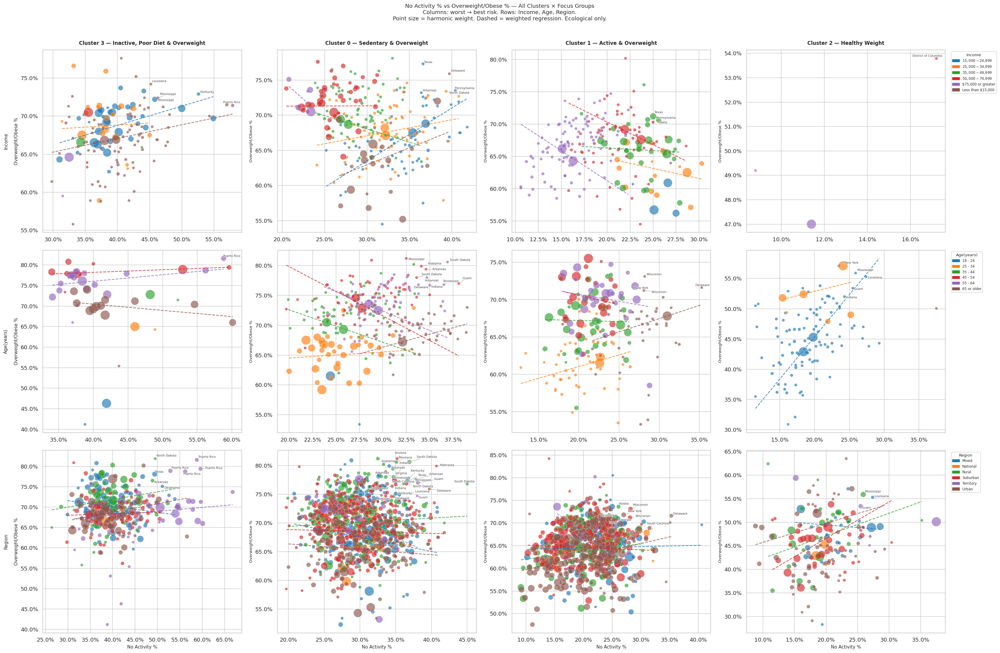

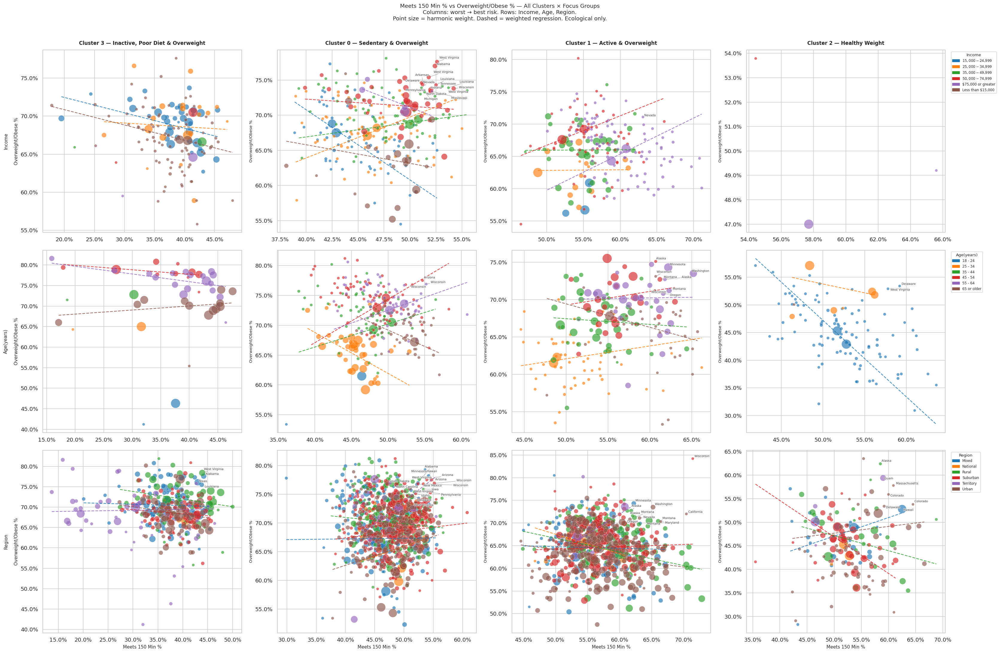

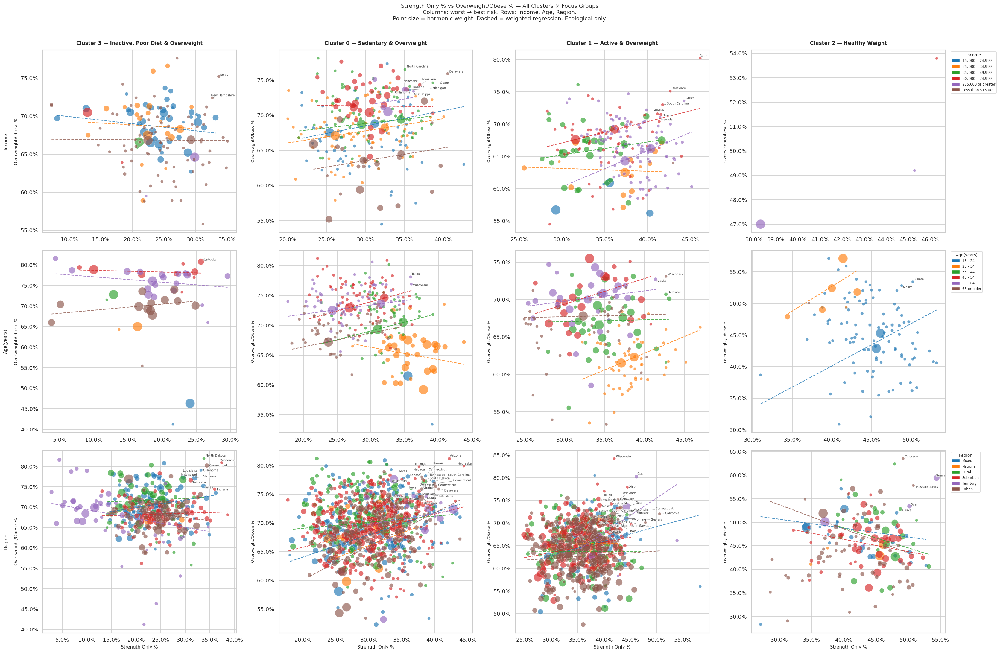

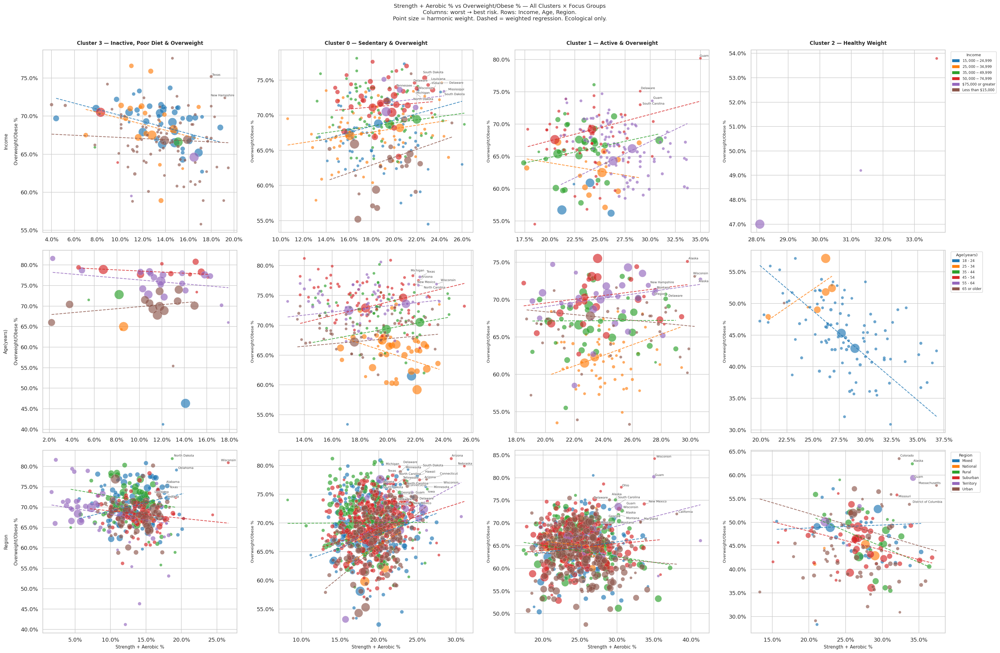

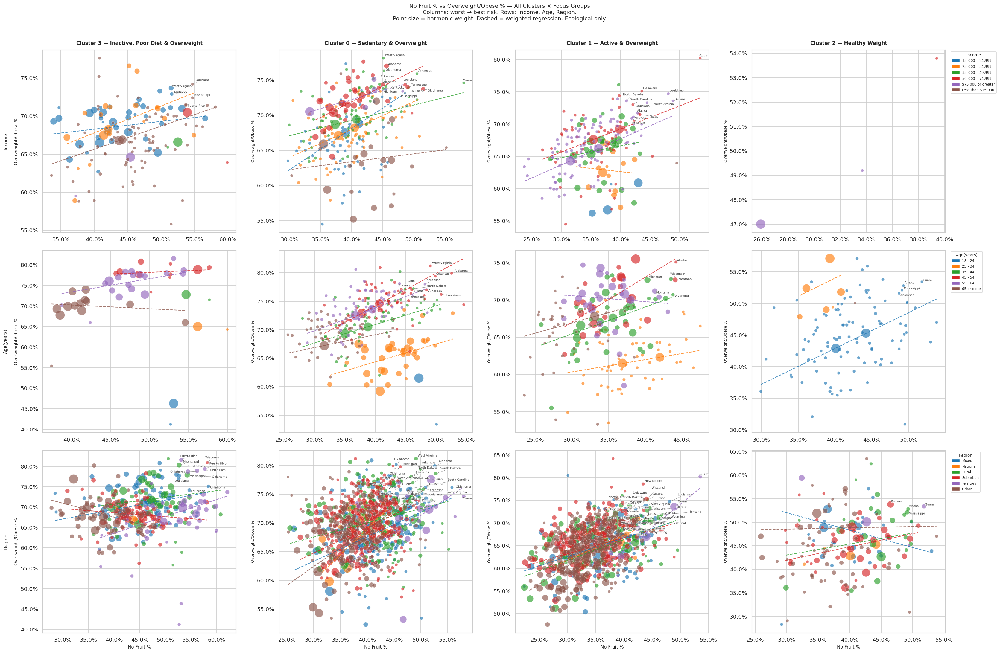

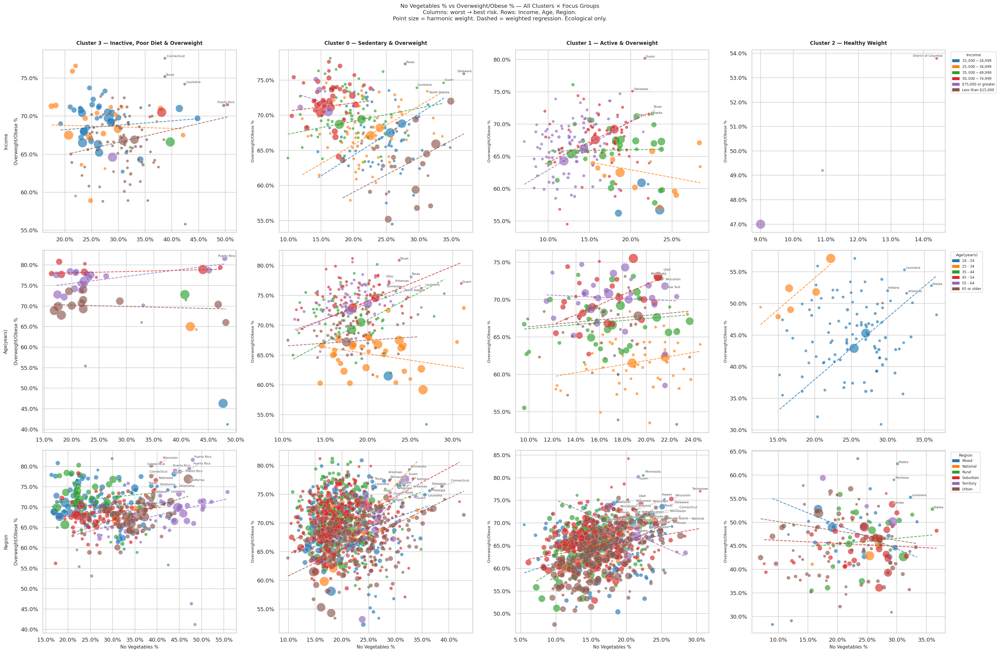

Expanded deep dive complete.


In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 13 — EXPANDED CLUSTER DEEP DIVE
#
# Y = Overweight/Obese % (fixed outcome)
# X = each of 6 predictor metrics
# Focus groups: Income, Age, Region (3 rows)
# Clusters ordered worst → best health profile (4 columns)
# ═════════════════════════════════════════════════════════════════════════════

PREDICTORS    = [m for m in METRICS if m != 'Overweight/Obese %']
CLUSTER_ORDER = [
    'Cluster 3 — Inactive, Poor Diet & Overweight',
    'Cluster 0 — Sedentary & Overweight',
    'Cluster 1 — Active & Overweight',
    'Cluster 2 — Healthy Weight',
]

for xm in PREDICTORS:
    fig, axes = plt.subplots(
        len(FOCUS_GROUPS), len(CLUSTER_ORDER),
        figsize=(7 * len(CLUSTER_ORDER), 6 * len(FOCUS_GROUPS)),
        sharex=False, sharey=False
    )

    for ri, grp in enumerate(FOCUS_GROUPS):
        demo    = color_col(cluster_df, grp)
        vals    = sorted(demo['_color_val'].dropna().unique())
        cmap    = dict(zip(vals, sns.color_palette(PALETTE, len(vals))))

        for ci, clabel in enumerate(CLUSTER_ORDER):
            ax  = axes[ri, ci]
            sub = demo[demo['Label'] == clabel].dropna(
                subset=[xm,'Overweight/Obese %','Harmonic Weight'])
            if sub.empty:
                ax.set_visible(False)
                continue

            for val in vals:
                grp_sub = sub[sub['_color_val'] == val]
                valid   = grp_sub.dropna(subset=[xm,'Overweight/Obese %','Harmonic Weight'])
                if grp_sub.empty:
                    continue
                ax.scatter(grp_sub[xm], grp_sub['Overweight/Obese %'],
                           color=cmap[val], s=scale_pt_sizes(grp_sub['Harmonic Weight']),
                           alpha=0.65, edgecolors='white', lw=0.3, label=val)
                if len(valid) >= 5:
                    plot_wls_line(ax,
                                  valid[xm].to_numpy(dtype=float),
                                  valid['Overweight/Obese %'].to_numpy(dtype=float),
                                  valid['Harmonic Weight'].to_numpy(dtype=float),
                                  cmap[val])

            label_extremes(ax, sub, xm, 'Overweight/Obese %', z=1.0)
            ax.xaxis.set_major_formatter(mtick.PercentFormatter())
            ax.yaxis.set_major_formatter(mtick.PercentFormatter())

            if ri == 0:
                ax.set_title(clabel, fontsize=10, fontweight='bold', pad=10)
            ax.set_ylabel(f'{grp}\n\nOverweight/Obese %' if ci == 0
                          else 'Overweight/Obese %',
                          fontsize=9 if ci == 0 else 8)
            if ri == len(FOCUS_GROUPS) - 1:
                ax.set_xlabel(xm, fontsize=9)

        axes[ri, -1].legend(
            handles=[mpatches.Patch(color=cmap[v], label=v) for v in vals],
            title=grp, bbox_to_anchor=(1.02,1), loc='upper left',
            fontsize=7, title_fontsize=8, framealpha=0.8)

    fig.suptitle(
        f'{xm} vs Overweight/Obese % — All Clusters × Focus Groups\n'
        'Columns: worst → best risk. Rows: Income, Age, Region.\n'
        'Point size = harmonic weight. Dashed = weighted regression. Ecological only.',
        fontsize=11, y=1.01)
    plt.tight_layout()
    plt.show()

print("Expanded deep dive complete.")

## **Expansive Cluster Analysis**

---

**Overview**

Here, I bring the analysis to the point where various inferences and conclusions can be made. Overall, we have discovered that income and age play major roles in health status, there exists some relationship between location and obesity rates of particular demographics, and we have identified particular categories of people that have different tendencies towards certain health habits which directly impacts their ability to gain or lose weight. Now, the goal is to find, who makes up these groups and how does locaition impact that answer?

**Implementation**

I once again utilized Python's matlab library, but there is a lot here, so let's go over some basics. There are 6 graphs for each health habit, organized by cluster horizontally and demographic (age, income, region) vertically. This allows us to easily view, what habit is being analyzed and what demographic are we checking to view cluster involvement. This allows for easy, intuitive gauging of how much a subgroup of demographic particpates in any activity and what portion of a cluster it makes up.

**Results**

Here I discovered the most defintitive outcomes from the entire analysis. To break things down more easily, I will first discuss demographic level impacts and then regional level impact:



*   ***Demographic***

    *   Age

        *  Members of the healthy cluster almost entirely consisted of younger people 18 - 34, wheras the unactive and unhealthy cluster were almost entire older people 55 and up. This makes sense as it is younger gererations typically have faster resting metabolism. The other two clusters were fairly balanced, however, being made up mostly of middle ages.



    *   Income

        * This is where the most intersting findings are found. For the active groups, members with an income of 75,000+ dominated a large portion of these groups, whereas income below 35,000 dominated the more inactive and unhealthy groups. This would indicate a inverse relationship between income and obesity rates, but that is not so straight-forward.

        * Interestingly, in between groups of 35,000 to 75,000 range, there is a flip. Those who have higher paying, middle-class wages tend to live a more sendentary lifestyle while those with lower middle-class income tend to be more active. This could be from factors such as the type of jobs these people carry. Perhaps those with higher income hold more office jobs while those with lower income have more blue collar type jobs that provide activity on the job. Additionally, it could attributed to higher stress levels in those higher paying roles.


*   ***Regional***

    * All of this can be tied together by regional impact. For the healthiest groups, they are dominated by those making 75000+, but we see this across multiple regions including urban, rural, mixed and suburban. However, we still do have some individuals with low income that fall into this cluster, though rare. We see the reason for this in the implications provided by other clusters. One thing that can be observed here is that in rural regions, there tends to be higher amounts of these groups drifting towards healthier habits. In fact, it can be observed that the urban regions tend to have higher rates of obesity and even if having better rates of health activity. Overall, though, the healthiest groups tend to live in rural or suburban regions. This could imply once again that stress is a major role here, as living in an urban setting can provide a more stress inducing lifestyle inhibiting ability to lose weight. Additionally, resource availability to lower incomes that live in these areas may play a role here. In rural areas, people tend to have healthier diets, possibly from the ability to have self sustained gardens or better purchasing power from a lower cost of living. Additionally, populations in these areas have easier access to outdoor activities that can a be key component for exercise ability. Going back to stress as a factor, this can be even further built upon by obsersivng the cluster of active but overweight. These members live in predominantly suburban/mixed regions, have upper middle-class incomes and are in the 25 - 64 age range. These are people that most likely have familes, which would attribute to a busy, more stressful, lifestyle given the circumstances. This yields stress, which yields impact on exercise habits and natural metabolism when considering weight loss.



In [ ]:
# ═════════════════════════════════════════════════════════════════════════════
# CELL 14 — PATHWAY SUMMARY
#
# Five-tier Sankey: Demographic → Exercise Risk → Diet Risk → OW/OB Risk
# Focus groups: Income, Age, Region
#
# Exercise score: No Activity (risk) + flipped Meets150/StrengthOnly/Str+Aer
# Diet score:     No Fruit + No Vegetables (both risk)
# Both normalized 0-1, tiers at data-driven 33rd/67th percentiles.
# Band width = sum of harmonic weights (reliability-weighted, not row count).
# ═════════════════════════════════════════════════════════════════════════════

sdf = profile[profile['Reliable']].copy().reset_index(drop=True)

# ── Build Exercise and Diet composite scores ──────────────────────────────────
def minmax(series):
    """Normalize series to 0-1."""
    mn, mx = series.min(), series.max()
    return (series - mn) / (mx - mn + 1e-9)

# Risk metrics: high = bad → keep as-is after normalization
# Protective metrics: high = good → flip (1 - normalized) so high = bad
sdf['ex_score']   = (minmax(sdf['No Activity %']) +
                     (1 - minmax(sdf['Meets 150 Min %'])) +
                     (1 - minmax(sdf['Strength Only %'])) +
                     (1 - minmax(sdf['Strength + Aerobic %']))) / 4

sdf['diet_score'] = (minmax(sdf['No Fruit %']) +
                     minmax(sdf['No Vegetables %'])) / 2

# Data-driven tier splits — ensures ~equal thirds regardless of distribution shape
def make_tiers(series, labels):
    p33, p67 = series.quantile(0.33), series.quantile(0.67)
    return pd.cut(series, bins=[-np.inf, p33, p67, np.inf], labels=labels)

sdf['Exercise_tier'] = make_tiers(sdf['ex_score'],
    ['Exercise: Favorable','Exercise: Moderate','Exercise: Unfavorable'])
sdf['Diet_tier']     = make_tiers(sdf['diet_score'],
    ['Diet: Favorable','Diet: Moderate','Diet: Unfavorable'])
sdf['OW_OB_tier']    = make_tiers(sdf['Overweight/Obese %'],
    ['Overweight/Obese: Low','Overweight/Obese: Mid','Overweight/Obese: High'])


# ── Shared Sankey utilities ───────────────────────────────────────────────────
EX_T  = ['Exercise: Favorable','Exercise: Moderate','Exercise: Unfavorable']
DT_T  = ['Diet: Favorable','Diet: Moderate','Diet: Unfavorable']
OB_T  = ['Overweight/Obese: Low','Overweight/Obese: Mid','Overweight/Obese: High']
INC_V = ['Less than $15,000','$15,000 - $24,999','$25,000 - $34,999',
         '$35,000 - $49,999','$50,000 - $74,999','$75,000 or greater']
AGE_V = ['18 - 24','25 - 34','35 - 44','45 - 54','55 - 64','65 or older']
REG_V = ['Urban','Suburban','Rural','Mixed']

# Node color logic: green=good, yellow=moderate, red=bad, grey=neutral
def node_clr(label):
    if any(x in label for x in ['Favorable','Overweight/Obese: Low',
                                  '$75,000','$50,000','Urban','18 - 24','25 - 34']):
        return 'rgba(26,152,80,0.8)'
    if any(x in label for x in ['Unfavorable','Overweight/Obese: High',
                                  'Less than $15,000','55 - 64','65 or older']):
        return 'rgba(215,48,39,0.8)'
    if any(x in label for x in ['Moderate','Mid']):
        return 'rgba(254,224,139,0.8)'
    return 'rgba(150,150,150,0.8)'

def link_clr(target):
    if any(x in target for x in ['Favorable','Overweight/Obese: Low']):
        return 'rgba(26,152,80,0.25)'
    if any(x in target for x in ['Unfavorable','Overweight/Obese: High']):
        return 'rgba(215,48,39,0.25)'
    if any(x in target for x in ['Moderate','Mid']):
        return 'rgba(254,224,139,0.25)'
    return 'rgba(150,150,150,0.15)'


def show_sankey(df, tier_cols, tier_vals, title, w_col='Harmonic Weight', min_w=10):
    """
    Build and display a Plotly Sankey.
    Band width = sum of harmonic weights (reliability-weighted, not row count).
    """
    nodes    = [n for tier in tier_vals for n in tier]
    idx      = {n: i for i, n in enumerate(nodes)}
    sources, targets, values, lcolors = [], [], [], []

    for t in range(len(tier_cols) - 1):
        for (a, b), grp in df.groupby([tier_cols[t], tier_cols[t+1]], observed=True):
            a, b = str(a), str(b)
            if a not in idx or b not in idx:
                continue
            flow = grp[w_col].sum()
            if flow < min_w:
                continue
            sources.append(idx[a])
            targets.append(idx[b])
            values.append(flow)
            lcolors.append(link_clr(b))

    go.Figure(data=[go.Sankey(
        arrangement='snap',
        node=dict(pad=20, thickness=20,
                  line=dict(color='white', width=0.5),
                  label=nodes, color=[node_clr(n) for n in nodes]),
        link=dict(source=sources, target=targets, value=values, color=lcolors)
    )]).update_layout(title_text=title, font_size=11,
                      height=650, width=1200).show()

# ═════════════════════════════════════════════════════════════════════════════
# SANKEY 3 — Region → Exercise → Diet → Overweight/Obese
# ═════════════════════════════════════════════════════════════════════════════
s3 = (sdf[sdf['Region'].isin(REG_V)]
      .dropna(subset=['Exercise_tier','Diet_tier','OW_OB_tier']))

show_sankey(s3, ['Region','Exercise_tier','Diet_tier','OW_OB_tier'],
            [REG_V, EX_T, DT_T, OB_T],
            'Sankey — Region → Exercise Risk → Diet Risk → Overweight/Obese<br>'
            '<sup>Band width = harmonic weight sum. Ecological only.</sup>')

# ═════════════════════════════════════════════════════════════════════════════
# SANKEY 4 — Region → Income → Exercise → Diet → Overweight/Obese
# The most complete pathway — geography → economics → behavior → outcome
# ═════════════════════════════════════════════════════════════════════════════
s4 = (sdf[(sdf['Group'] == 'Income') &
          (sdf['Group Value'].isin(INC_V)) &
          (sdf['Region'].isin(REG_V))]
      .dropna(subset=['Exercise_tier','Diet_tier','OW_OB_tier'])
      .rename(columns={'Group Value':'Income'}))

show_sankey(s4, ['Region','Income','Exercise_tier','Diet_tier','OW_OB_tier'],
            [REG_V, INC_V, EX_T, DT_T, OB_T],
            'Sankey — Region → Income → Exercise → Diet → Overweight/Obese<br>'
            '<sup>Band width = harmonic weight sum. Ecological only.</sup>')

# ═════════════════════════════════════════════════════════════════════════════
# SANKEY 5 — Income pathway faceted by Urbanicity
# Shows whether the income → behavior → weight pathway differs geographically
# ═════════════════════════════════════════════════════════════════════════════
for urb in REG_V:
    s5 = (sdf[(sdf['Group'] == 'Income') &
              (sdf['Group Value'].isin(INC_V)) &
              (sdf['Region'] == urb)]
          .dropna(subset=['Exercise_tier','Diet_tier','OW_OB_tier'])
          .rename(columns={'Group Value':'Income'}))
    if s5.empty:
        continue
    show_sankey(s5, ['Income','Exercise_tier','Diet_tier','OW_OB_tier'],
                [INC_V, EX_T, DT_T, OB_T],
                f'Sankey — Income → Exercise → Diet → OW/OB  [{urb}]<br>'
                '<sup>Band width = harmonic weight sum. Ecological only.</sup>')


print("\nCell 14 complete.")


Cell 14 complete.


## **Summary**

---

To summarize the findings in this research, I discovered that there exists a regional impact on a given demographics tendency to partake in health activities to contirbute to lower levels of obesity. Specfically, the most focused demographic that I found was income level, which showed that populations that have higher paying incomes are more likely to take up healthy habits as opposed to low income population, while the middle class tends to flip this narrative and have less obesity at lower paid wages. The overall indicative factor here would be job related stress factors that have specific salary threshold of changing impact. Additionally, the major attribute of regional location changes the weight that a demographic carries in determining impact on health. Those that live in rural areas tend to have improved health habits for lower incomes level as opposed to their urban counterparts. This is likely attributed to better access to healthy dietary habits as well as availability of health activities.

In this cell, I compile all of this together to show the grand flow of this information and its magnitude of impact as it feeds into each attribute and deterimes health status. First I breakdown urbanicity into health health habits, then income. I then combine the two for a compiled view before showing each urbanicity level broken down by income for a more detail perspective on impact. This is implemented using Sankey diagrams where I opted to to simplify the results into more favorable, non-favorable, or moderate habits as well as high, mid and low weight status. This utilizes the harmonic weights from previous sections in order to provide an honest and accurate representation. I used a minmax algorithm to do this, by considering the lowest weight to be 0 and highest one and every weight proporitionally falling between the 2 to determine buckets.

## **Resources**

---

#Collaboration:
*   None

#Web Sources:
*   Centers for Disease Control and Prevention. (n.d.). Behavioral Risk Factor Surveillance System (BRFSS).
https://www.cdc.gov/brfss/


* GeeksforGeeks. (2025). Elbow Method for optimal value of k in KMeans.
https://www.geeksforgeeks.org/machine-learning/elbow-method-for-optimal-value-of-k-in-kmeans/


* Investopedia. (n.d.). Harmonic average.
https://www.investopedia.com/terms/h/harmonicaverage.asp


* Plotly. (n.d.). Sankey diagram in Python.
https://plotly.com/python/sankey-diagram/


* Scikit-learn developers. (n.d.). Scikit-learn documentation.
https://scikit-learn.org/stable/


#AI Tools:
*   I used Claude AI in order to develop much of the code for this analysis.
    *   Key steps included providing a very detailed description of my data structure as well as the code to clean it. After having my code updated, I then presented it with the ideas for how I want to work with the data as well as steps to perform my exploratory data analysis.
    *   Once the exploratory analysis was complete, I directed it to repeat the process a few times as I tuned my data tables to a point that they could be easily used in downstream methods
    * Once complete, I had a direction to take my analysis and worked with the tool for assistance on developing my code for each cell and step I wanted to take moving forwards. I then reproduced the entire project to clean and polish the resulting cells.


